In [1]:
import h5py
import healpy as hp
import numpy as np
import matplotlib.pyplot as plt

# Loading and smoothing functions

In [2]:
probe_tags= {'kg': 'weak lensing', 'dg': 'galaxy clustering', 'ia': 'intrinsic alignment'}

In [3]:
def smooth(m, sig_arcmin=8, nest=False):
    if sig_arcmin>0:
        m = hp.smoothing(m, sigma=np.deg2rad(sig_arcmin/60), nest=nest)    
    return m

In [4]:
def load_projected_maps(dirname, tag='nobaryons', sig_smooth_arcmin=5, verb=False):

    all_samples = []
    maps = {}
    with h5py.File(f'{dirname}/projected_probes_maps_{tag}512.h5', 'r') as f:
        probes = list(f.keys())
        for probe in probes:
            maps[probe] = {}
            probe_tag = probe_tags[probe]
            samples = f[probe].keys()
            all_samples.extend(samples)
            for sample in samples:
                
                if verb:
                    print(f'probe = {probe_tag:<25s}  sample = {sample:>10s}')
                
                maps[probe][sample] = smooth(np.array(f[probe][sample]), sig_arcmin=sig_smooth_arcmin)

                # hp.write_map(f'map_{probe}_{sample}.fits', maps[probe][sample], fits_IDL=False)
                    
    return maps, probes, list(set(all_samples))[::-1].sort()

In [5]:
def plot_map(m, title=''):

    nx, ny = 1, 1; figsize=8; fig, ax  = plt.subplots(nx, ny, figsize=(ny * figsize * 1.25, nx * figsize), squeeze=False); axl=ax.ravel(); axc=ax[0,0];  fig.set_label(' ')
    vmin, vmax = np.percentile(m, [5, 95])
    m_ = smooth(m)
    hp.orthview(m_, cmap='plasma', bgcolor='white', hold=True, title=title, half_sky=True, min=vmin, max=vmax)

def plot_probe_map(probe, sample, maps, tag=''):

    if probe in maps.keys():
        if sample in maps[probe].keys():
            plot_map(maps[probe][sample], title=f'{tag} {probe_tags[probe]} {sample}')
        else:
            nx, ny = 1, 1; figsize=8; fig, ax  = plt.subplots(nx, ny, figsize=(ny * figsize * 1.25, nx * figsize), squeeze=False); axl=ax.ravel(); axc=ax[0,0];  fig.set_label(' ')
            axc.set(title=f'{probe_tags[probe]} {sample} map not available')
            axc.axis('off')

In [6]:
maps_dmo, probes, all_samples = load_projected_maps('/home/tersenov/CosmoGridV1/stage3_forecast/grid/cosmo_000001/perm_0000/', 'nobaryons', verb=True, sig_smooth_arcmin=12)

probe = galaxy clustering          sample = stage3_lensing1


/tmp/ipykernel_3837138/2356219365.py:17: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  maps[probe][sample] = smooth(np.array(f[probe][sample]), sig_arcmin=sig_smooth_arcmin)


probe = galaxy clustering          sample = stage3_lensing2
probe = galaxy clustering          sample = stage3_lensing3
probe = galaxy clustering          sample = stage3_lensing4
probe = intrinsic alignment        sample = stage3_lensing1
probe = intrinsic alignment        sample = stage3_lensing2
probe = intrinsic alignment        sample = stage3_lensing3
probe = intrinsic alignment        sample = stage3_lensing4
probe = weak lensing               sample = stage3_lensing1
probe = weak lensing               sample = stage3_lensing2
probe = weak lensing               sample = stage3_lensing3
probe = weak lensing               sample = stage3_lensing4


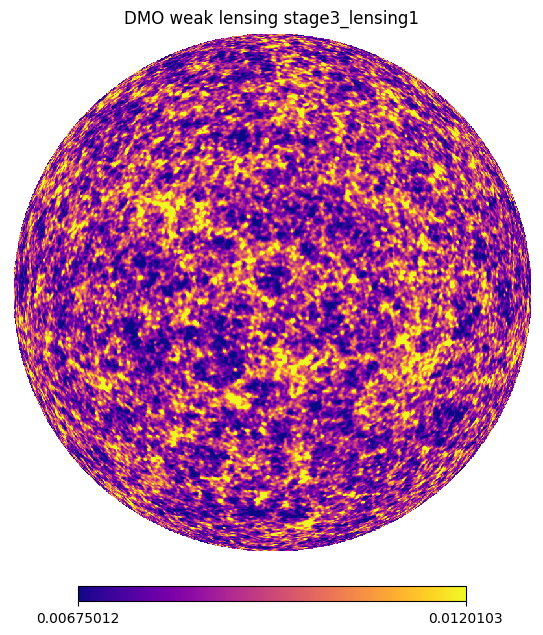

In [7]:
plot_probe_map('kg', 'stage3_lensing1', maps_dmo, tag='DMO')

# **Test sourceclus**

# Power spectrum

In [6]:
with h5py.File('/home/tersenov/CosmoGridV1/stage3_forecast/grid/cosmo_000002/perm_0000/projected_probes_maps_nobaryons512.h5', 'r') as f:
    kg = np.array(f['kg/stage3_lensing1'])
    dg = np.array(f['dg/stage3_lensing1'])
    ia = np.array(f['ia/stage3_lensing1'])

/tmp/ipykernel_1484835/3234512237.py:2: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f['kg/stage3_lensing1'])
/tmp/ipykernel_1484835/3234512237.py:3: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  dg = np.array(f['dg/stage3_lensing1'])
/tmp/ipykernel_1484835/3234512237.py:4: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  ia = np.array(f['ia/stage3_lensing1'])


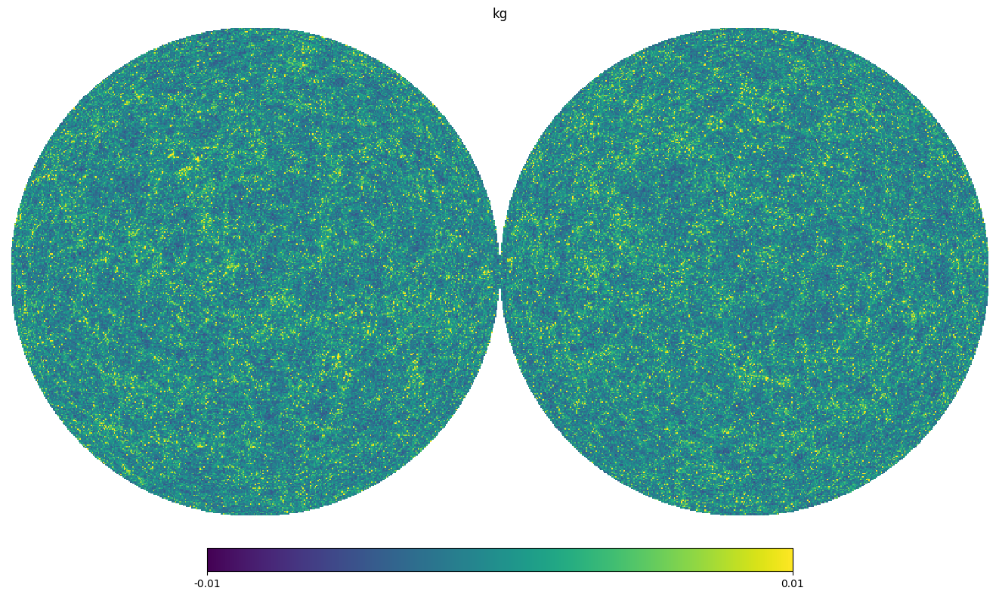

In [9]:
plt.figure(figsize = (20, 10))
hp.orthview(kg - np.mean(kg), cmap='viridis', bgcolor='white', hold=True, title='kg', min=-0.01, max=0.01)

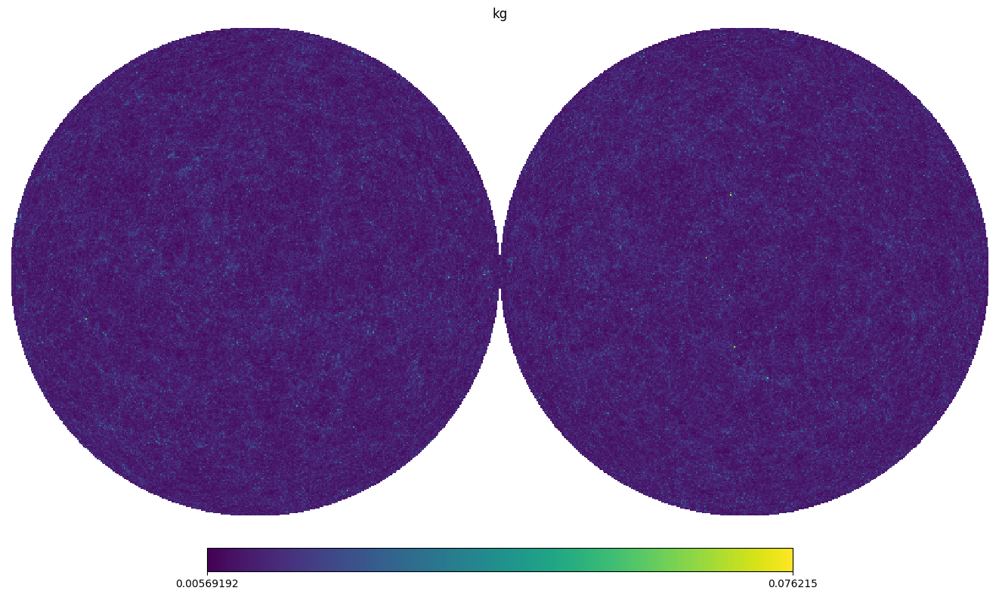

In [10]:
plt.figure(figsize = (20, 10))
hp.orthview(kg, cmap='viridis', bgcolor='white', hold=True, title='kg')

<Figure size 2000x1000 with 0 Axes>

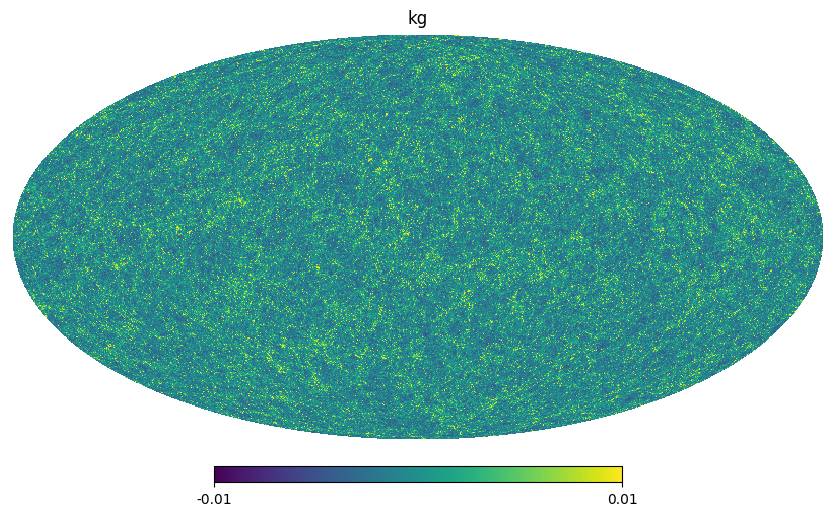

In [11]:
plt.figure(figsize = (20, 10))
hp.mollview(kg - np.mean(kg), cmap='viridis', title='kg', min=-0.01, max=0.01)

<Figure size 2000x1000 with 0 Axes>

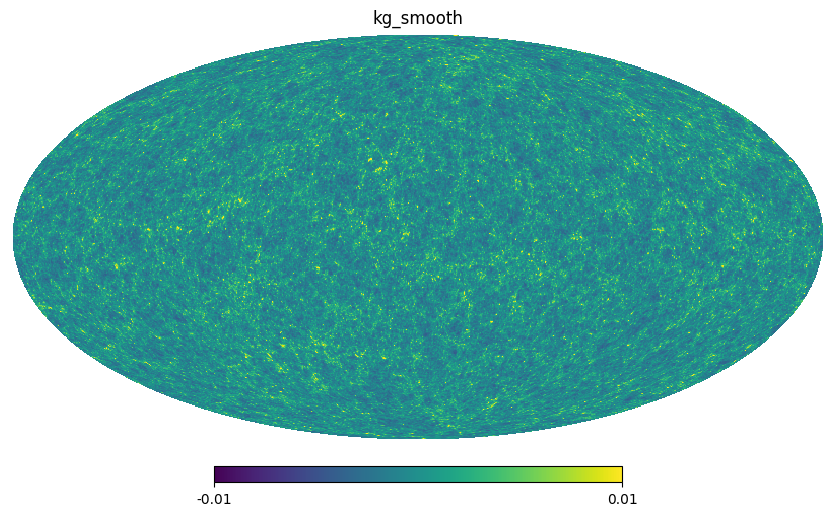

In [12]:
# smooth kg map
kg_smooth = smooth(kg)

plt.figure(figsize = (20, 10))
hp.mollview(kg_smooth - np.mean(kg_smooth), cmap='viridis', title='kg_smooth', min=-0.01, max=0.01)

In [7]:
def scale_cls(c):
    ells = np.arange(len(c))
    return ells, ells*(ells+1)*c/(np.pi*2)

In [ ]:
cls_kg = hp.alm2cl(hp.map2alm(kg))
cls_kg_smooth = hp.alm2cl(hp.map2alm(kg_smooth))

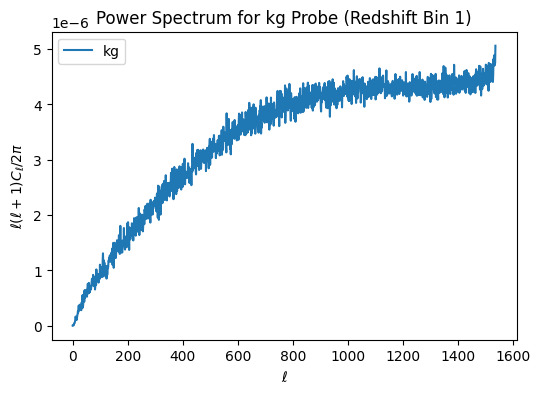

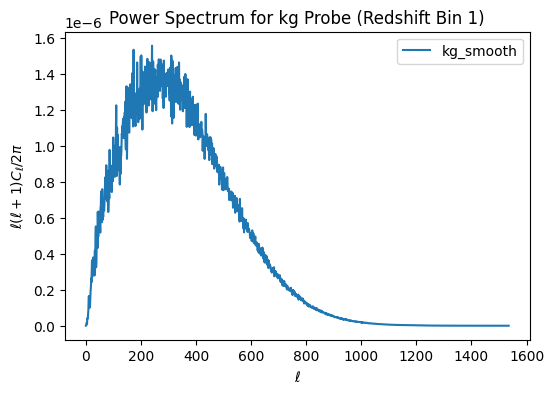

In [15]:
# Plot the power spectrum
plt.figure(figsize=(6, 4))
plt.plot(*scale_cls(cls_kg), label='kg')
plt.ylabel(r'$\ell(\ell+1)C_\ell / 2\pi$')
plt.xlabel(r'$\ell$')
plt.title(f'Power Spectrum for kg Probe (Redshift Bin 1)')
plt.legend()
plt.show()
plt.figure(figsize=(6, 4))
plt.plot(*scale_cls(cls_kg_smooth), label='kg_smooth')
plt.ylabel(r'$\ell(\ell+1)C_\ell / 2\pi$')
plt.xlabel(r'$\ell$')
plt.title(f'Power Spectrum for kg Probe (Redshift Bin 1)')
plt.legend()
plt.show()

## With baryons

In [16]:
with h5py.File('/home/tersenov/CosmoGridV1/stage3_forecast/grid/cosmo_000002/perm_0000/projected_probes_maps_baryonified512.h5', 'r') as f:
    kg_bar = np.array(f['kg/stage3_lensing1'])
    dg_bar = np.array(f['dg/stage3_lensing1'])
    ia_bar = np.array(f['ia/stage3_lensing1'])

/tmp/ipykernel_708447/4111155988.py:2: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg_bar = np.array(f['kg/stage3_lensing1'])
/tmp/ipykernel_708447/4111155988.py:3: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  dg_bar = np.array(f['dg/stage3_lensing1'])
/tmp/ipykernel_708447/4111155988.py:4: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  ia_bar = np.array(f['ia/stage3_lensing1'])


In [17]:
kg_bar - kg

array([ 3.5740435e-05, -1.2735836e-05,  9.6419826e-06, ...,
       -8.6513348e-05,  2.7342699e-05,  1.1406839e-05], dtype=float32)

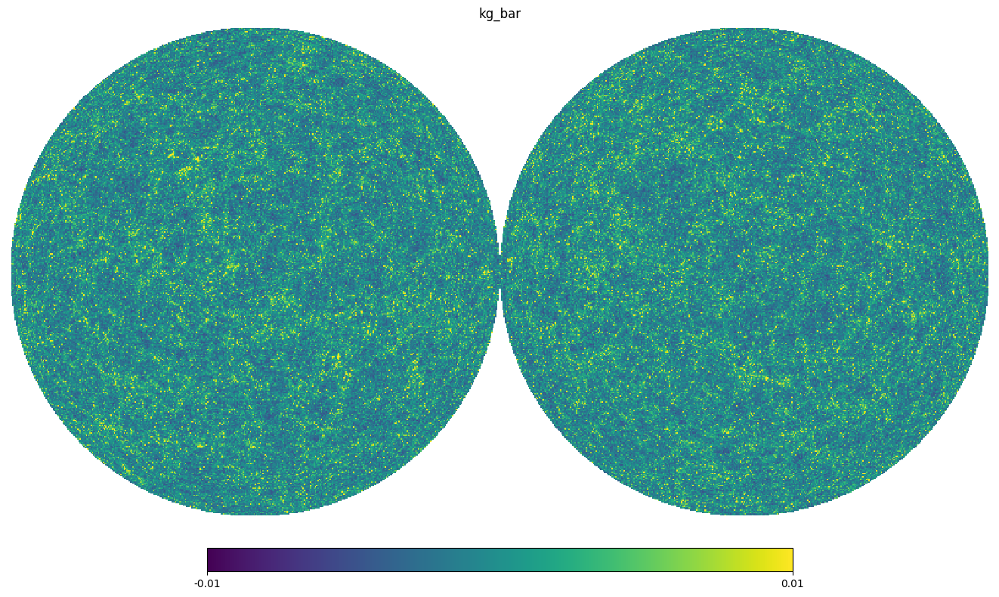

In [18]:
plt.figure(figsize = (20, 10))
hp.orthview(kg_bar - np.mean(kg_bar), cmap='viridis', bgcolor='white', hold=True, title='kg_bar', min=-0.01, max=0.01)

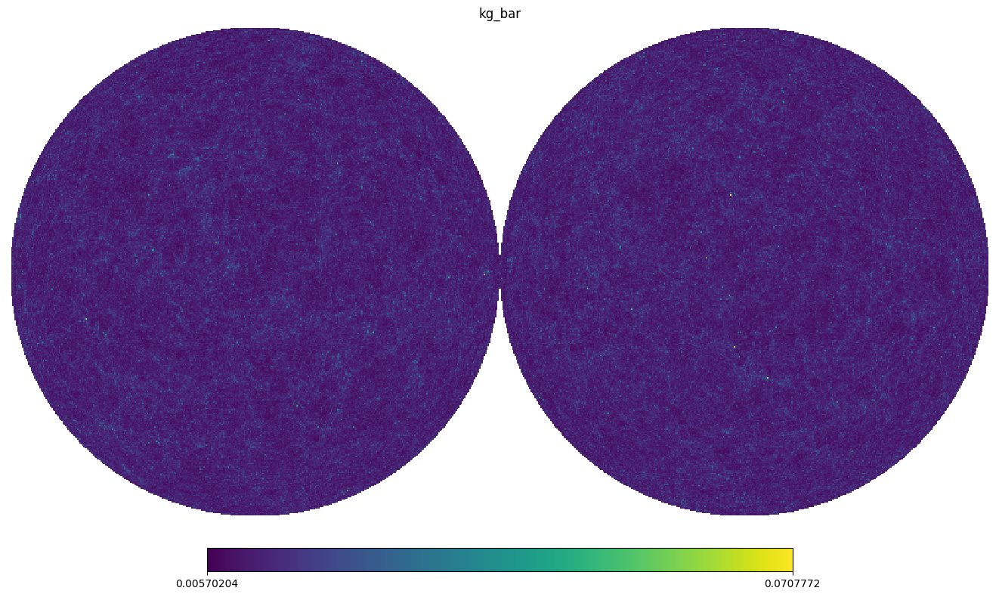

In [19]:
plt.figure(figsize = (20, 10))
hp.orthview(kg_bar, cmap='viridis', bgcolor='white', hold=True, title='kg_bar')

<Figure size 2000x1000 with 0 Axes>

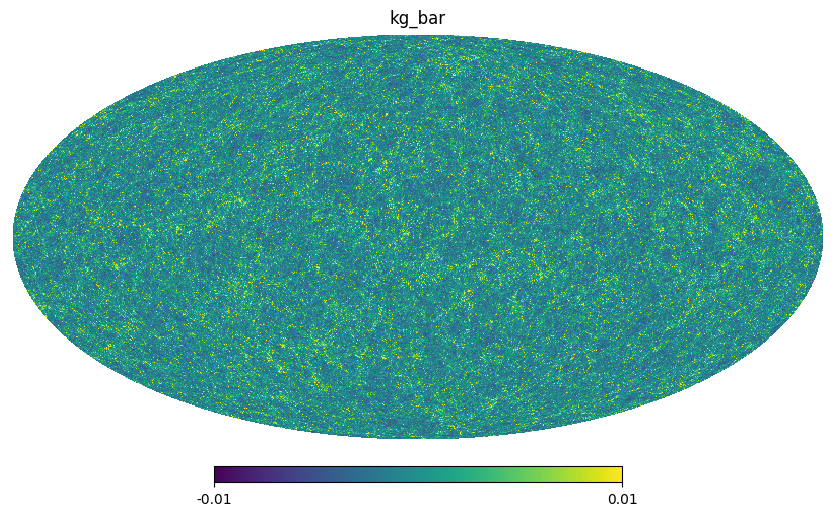

In [20]:
plt.figure(figsize = (20, 10))
hp.mollview(kg_bar - np.mean(kg_bar), cmap='viridis', title='kg_bar', min=-0.01, max=0.01)

<Figure size 2000x1000 with 0 Axes>

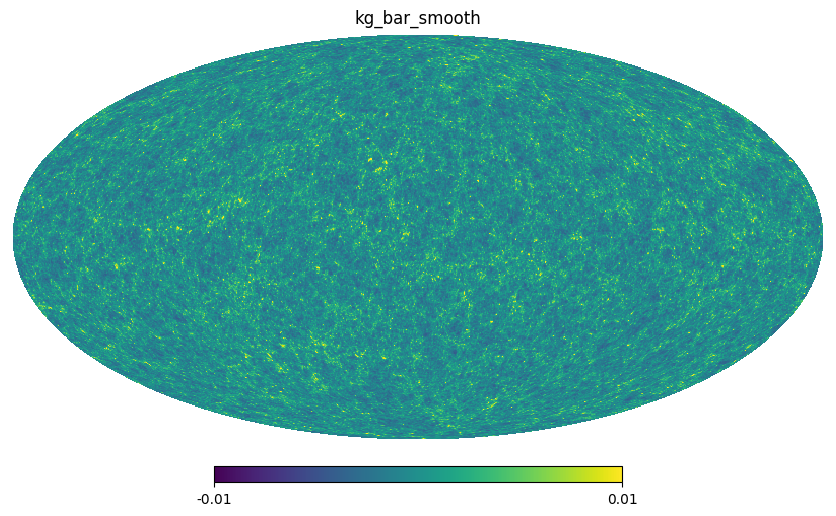

In [21]:
# smooth kg map
kg_bar_smooth = smooth(kg_bar)

plt.figure(figsize = (20, 10))
hp.mollview(kg_bar_smooth - np.mean(kg_bar_smooth), cmap='viridis', title='kg_bar_smooth', min=-0.01, max=0.01)

In [19]:
cls_kg_bar = hp.alm2cl(hp.map2alm(kg_bar))
cls_kg_bar_smooth = hp.alm2cl(hp.map2alm(kg_bar_smooth))

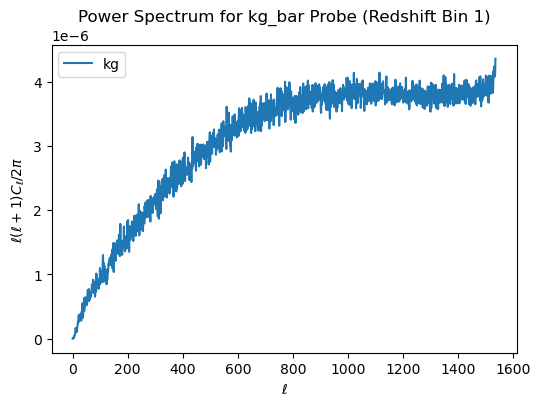

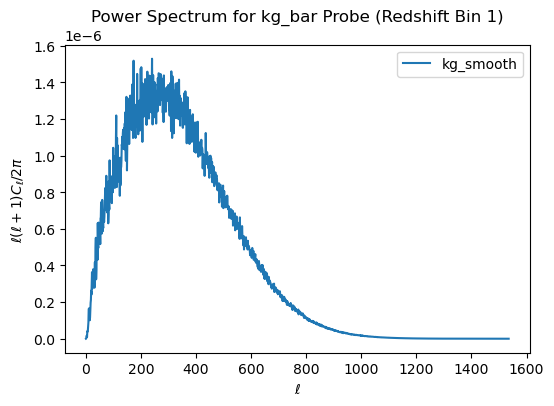

In [20]:
# Plot the power spectrum
plt.figure(figsize=(6, 4))
plt.plot(*scale_cls(cls_kg_bar), label='kg')
plt.ylabel(r'$\ell(\ell+1)C_\ell / 2\pi$')
plt.xlabel(r'$\ell$')
plt.title(f'Power Spectrum for kg_bar Probe (Redshift Bin 1)')
plt.legend()
plt.show()
plt.figure(figsize=(6, 4))
plt.plot(*scale_cls(cls_kg_bar_smooth), label='kg_smooth')
plt.ylabel(r'$\ell(\ell+1)C_\ell / 2\pi$')
plt.xlabel(r'$\ell$')
plt.title(f'Power Spectrum for kg_bar Probe (Redshift Bin 1)')
plt.legend()
plt.show()

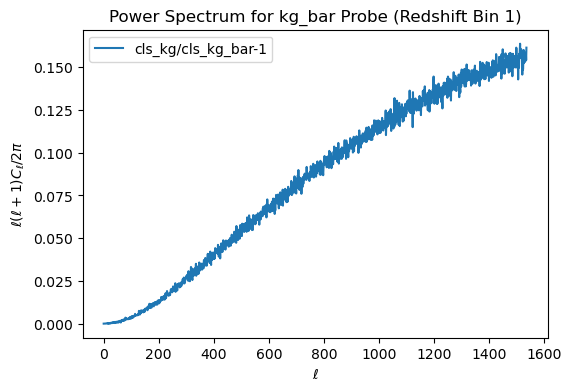

In [23]:
# Plot the difference of the baryonic and non-baryonic cls
plt.figure(figsize=(6, 4))
plt.plot(cls_kg/cls_kg_bar-1, label='cls_kg/cls_kg_bar-1')
plt.ylabel(r'$\ell(\ell+1)C_\ell / 2\pi$')
plt.xlabel(r'$\ell$')
plt.title(f'Power Spectrum for kg_bar Probe (Redshift Bin 1)')
plt.legend()
plt.show()

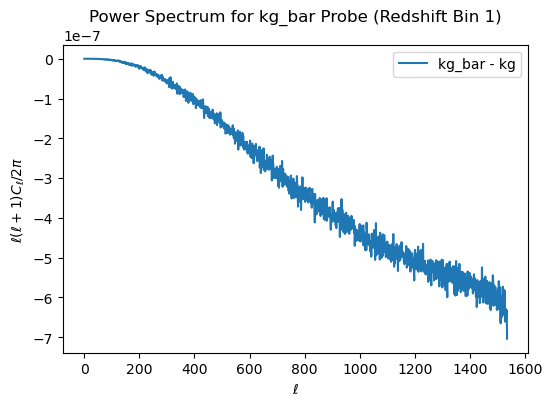

In [22]:
# Plot the difference of the baryonic and non-baryonic cls
plt.figure(figsize=(6, 4))
plt.plot(*scale_cls(cls_kg_bar - cls_kg), label='kg_bar - kg')
plt.ylabel(r'$\ell(\ell+1)C_\ell / 2\pi$')
plt.xlabel(r'$\ell$')
plt.title(f'Power Spectrum for kg_bar Probe (Redshift Bin 1)')
plt.legend()
plt.show()

# Analyze fiducial cosmologies to calculate covariance

In [3]:
with h5py.File('/home/tersenov/CosmoGridV1/stage3_forecast/fiducial/cosmo_fiducial/perm_0000/projected_probes_maps_nobaryons512.h5', 'r') as f:
    kg = np.array(f['kg/stage3_lensing1'])
    
with h5py.File('/home/tersenov/CosmoGridV1/stage3_forecast/fiducial/cosmo_fiducial/perm_0000/projected_probes_maps_baryonified512.h5', 'r') as f:
    kg_b = np.array(f['kg/stage3_lensing1'])

<Figure size 2000x1000 with 0 Axes>

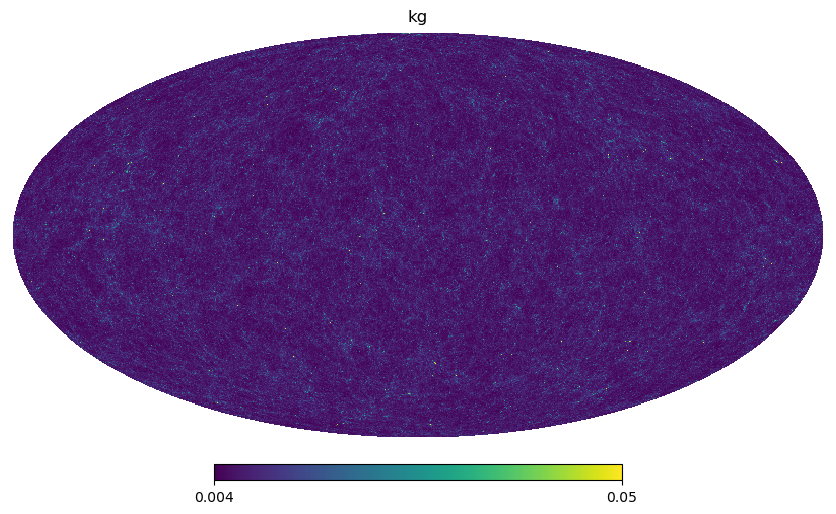

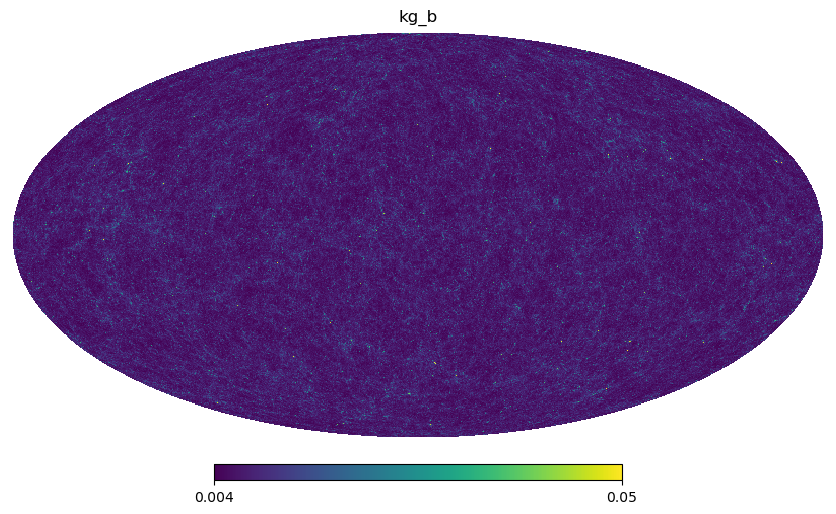

In [4]:
plt.figure(figsize = (20, 10))
hp.mollview(kg, cmap='viridis', title='kg', min=0.004, max=0.05)

hp.mollview(kg_b, cmap='viridis', title='kg_b', min=0.004, max=0.05)

In [5]:
cls_kg = hp.alm2cl(hp.map2alm(kg))
cls_kg_b = hp.alm2cl(hp.map2alm(kg_b))

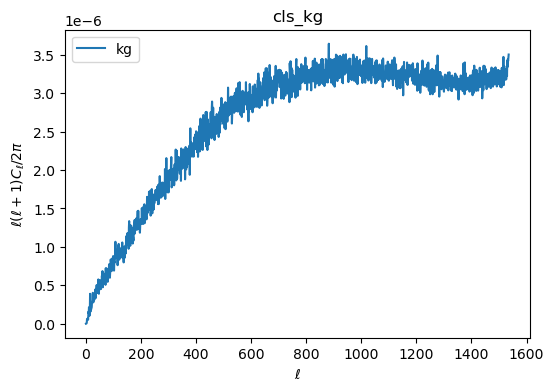

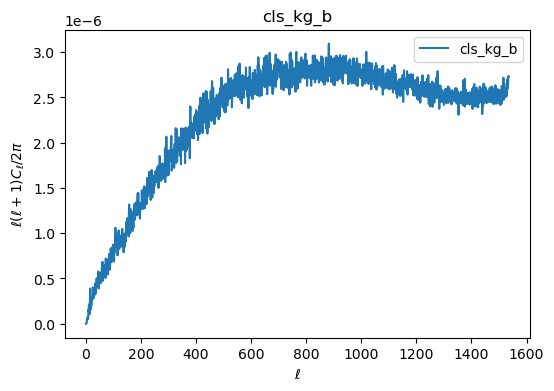

In [8]:
# Plot the power spectrum
plt.figure(figsize=(6, 4))
plt.plot(*scale_cls(cls_kg), label='kg')
plt.ylabel(r'$\ell(\ell+1)C_\ell / 2\pi$')
plt.xlabel(r'$\ell$')
plt.title(f'cls_kg')
plt.legend()
plt.show()
plt.figure(figsize=(6, 4))
plt.plot(*scale_cls(cls_kg_b), label='cls_kg_b')
plt.ylabel(r'$\ell(\ell+1)C_\ell / 2\pi$')
plt.xlabel(r'$\ell$')
plt.title(f'cls_kg_b')
plt.legend()
plt.show()

In [75]:
_, scaled_cls_kg = scale_cls(cls_kg)
_, scaled_cls_kg_b = scale_cls(cls_kg_b)

/tmp/ipykernel_2127057/1470064833.py:3: RuntimeWarning: invalid value encountered in divide
  plt.plot(scaled_cls_kg/scaled_cls_kg_b-1, label='cls_kg/cls_kg_b-1')


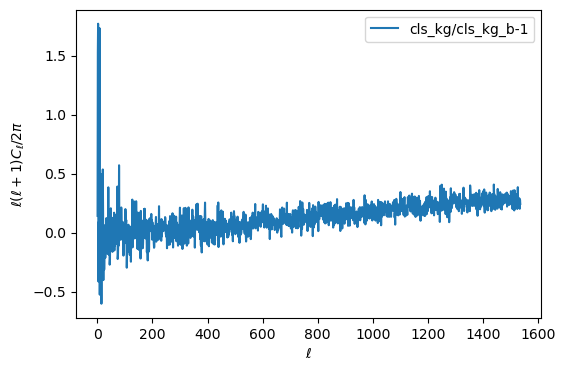

In [76]:
# Plot the difference of the baryonic and non-baryonic cls
plt.figure(figsize=(6, 4))
plt.plot(scaled_cls_kg/scaled_cls_kg_b-1, label='cls_kg/cls_kg_b-1')
plt.ylabel(r'$\ell(\ell+1)C_\ell / 2\pi$')
plt.xlabel(r'$\ell$')
plt.legend()
plt.show()

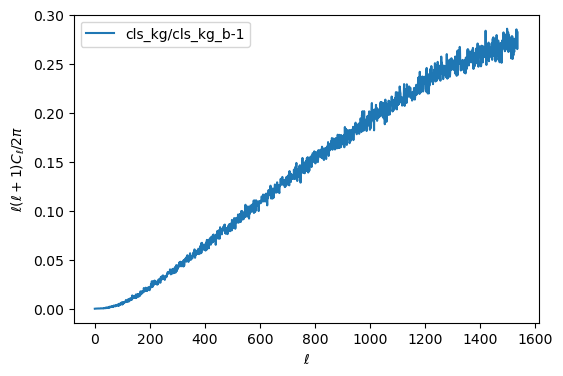

In [34]:
# Plot the difference of the baryonic and non-baryonic cls
plt.figure(figsize=(6, 4))
plt.plot(cls_kg/cls_kg_b-1, label='cls_kg/cls_kg_b-1')
plt.ylabel(r'$\ell(\ell+1)C_\ell / 2\pi$')
plt.xlabel(r'$\ell$')
plt.legend()
plt.show()

In [8]:
def get_bin_map(id_zbin, perm_index, with_baryons=True, smooth_arcmin=0):
    baryon_effect = 'baryonified' if with_baryons else 'nobaryons'
    file_path = f'/home/tersenov/CosmoGridV1/stage3_forecast/fiducial/cosmo_fiducial/perm_{perm_index:04d}/projected_probes_maps_{baryon_effect}512.h5'
    with h5py.File(file_path, 'r') as f:
        kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])

    # # Smoothing the kg map
    if smooth_arcmin > 0:
        kg = smooth(kg, smooth_arcmin)
            
    return kg

In [8]:
# Parameters
n_permutations = 200  # Number of permutations (0000 to 0199)
id_zbin = 0  # Redshift bin index, e.g., 0 for the first bin
smooth_arcmin = 0

In [11]:
# Store power spectra for all permutations
scaled_cls_list_kg = []

for perm_index in range(n_permutations):
    # Extract and process the kg map for the current permutation
    kg = get_bin_map(id_zbin, perm_index, with_baryons=False, smooth_arcmin=0)
    
    # Compute the power spectrum for the kg map
    cls_kg = hp.alm2cl(hp.map2alm(kg))
    
    # Scale the power spectrum
    _, scaled_cls_kg = scale_cls(cls_kg)
    
    # Store the scaled power spectrum
    scaled_cls_list_kg.append(scaled_cls_kg)
    
# Convert list of scaled Cls to a 2D numpy array (n_permutations x len(ells))
scaled_cls_array = np.array(scaled_cls_list_kg)


In [12]:
covariance_matrix = np.cov(scaled_cls_array, rowvar=False)

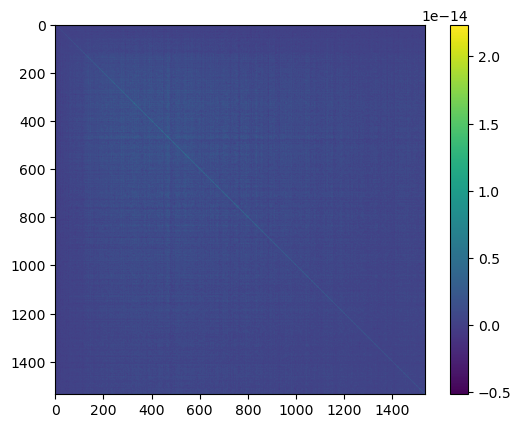

In [15]:
# plot covariance
plt.imshow(covariance_matrix)
plt.colorbar()

In [16]:
# Store power spectra for all permutations
scaled_cls_list_kg_b = []

for perm_index in range(n_permutations):
    # Extract and process the kg map for the current permutation
    kg_b = get_bin_map(id_zbin, perm_index, with_baryons=True, smooth_arcmin=0)
    
    # Compute the power spectrum for the kg map
    cls_kg_b = hp.alm2cl(hp.map2alm(kg_b))
    
    # Scale the power spectrum
    _, scaled_cls_kg_b = scale_cls(cls_kg_b)
    
    # Store the scaled power spectrum
    scaled_cls_list_kg_b.append(scaled_cls_kg_b)
    
# Convert list of scaled Cls to a 2D numpy array (n_permutations x len(ells))
scaled_cls_array_b = np.array(scaled_cls_list_kg_b)


In [17]:
covariance_matrix_b = np.cov(scaled_cls_array_b, rowvar=False)

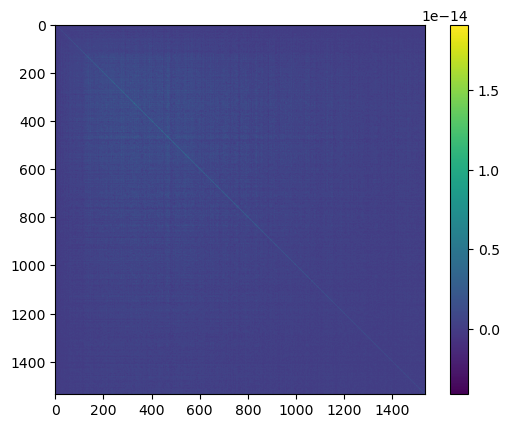

In [18]:
# plot covariance
plt.imshow(covariance_matrix_b)
plt.colorbar()

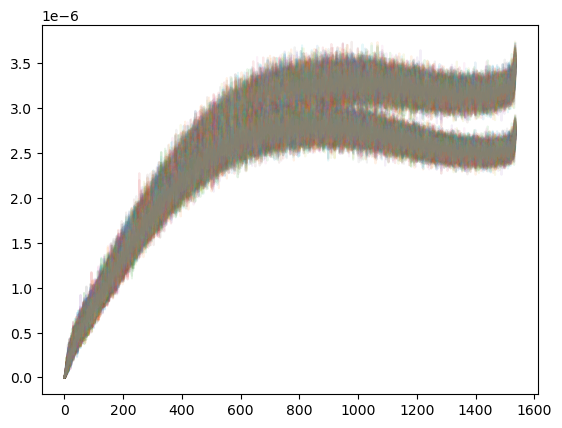

In [23]:
# plot all the scaled cls
for i in range(n_permutations):
    plt.plot(scaled_cls_array[i], alpha=0.1)
for i in range(n_permutations):
    plt.plot(scaled_cls_array_b[i], alpha=0.1)

In [24]:
perm_index

199

In [25]:
# Load the maps for both cases (with baryons and without baryons)
kg = get_bin_map(id_zbin, perm_index, with_baryons=False, smooth_arcmin=smooth_arcmin)  # Dark matter only
kg_b = get_bin_map(id_zbin, perm_index, with_baryons=True, smooth_arcmin=smooth_arcmin)  # With baryons

# Compute the power spectra
cls_kg = hp.alm2cl(hp.map2alm(kg))
cls_kg_b = hp.alm2cl(hp.map2alm(kg_b))

# Scale the power spectra
ells, scaled_cls_kg = scale_cls(cls_kg)
_, scaled_cls_kg_b = scale_cls(cls_kg_b)

# Calculate the fractional difference between the two power spectra
fractional_difference = (scaled_cls_kg - scaled_cls_kg_b) / scaled_cls_kg_b

/tmp/ipykernel_3239483/266093236.py:14: RuntimeWarning: invalid value encountered in divide
  fractional_difference = (scaled_cls_kg - scaled_cls_kg_b) / scaled_cls_kg_b


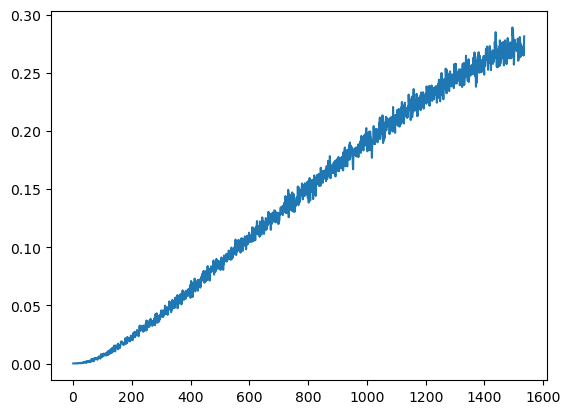

In [26]:
plt.plot(ells, fractional_difference)

In [27]:
var_kg = np.diag(covariance_matrix)
var_kg_b = np.diag(covariance_matrix_b)

In [29]:
# Propagate the errors to the fractional difference
fractional_difference_variance = var_kg / scaled_cls_kg_b**2 + (scaled_cls_kg**2 * var_kg_b) / scaled_cls_kg_b**4
fractional_difference_std = np.sqrt(fractional_difference_variance)

/tmp/ipykernel_3239483/1543759900.py:2: RuntimeWarning: invalid value encountered in divide
  fractional_difference_variance = var_kg / scaled_cls_kg_b**2 + (scaled_cls_kg**2 * var_kg_b) / scaled_cls_kg_b**4


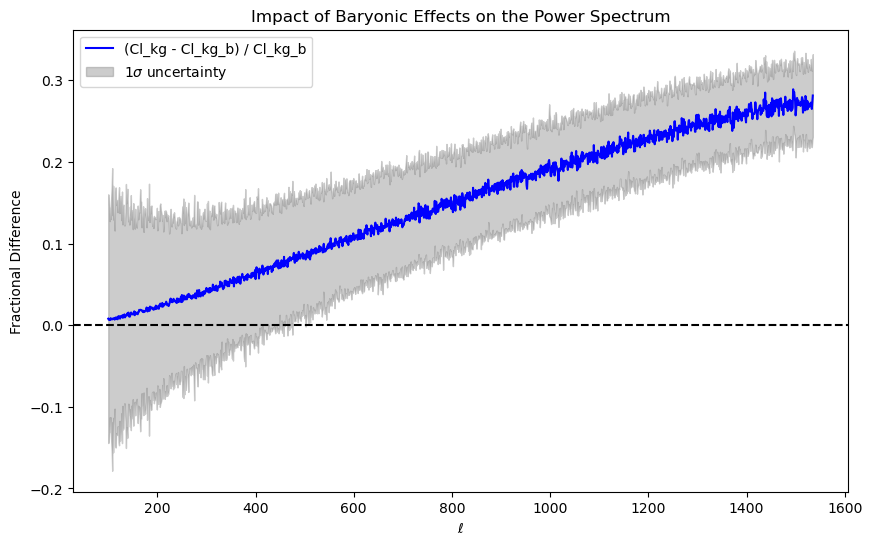

In [31]:

# Plot the results
plt.figure(figsize=(10, 6))

# Plot the fractional difference
plt.plot(ells[100:], fractional_difference[100:], label='(Cl_kg - Cl_kg_b) / Cl_kg_b', color='blue')

# Plot the propagated 1-sigma error band
plt.fill_between(ells[100:], fractional_difference[100:] - fractional_difference_std[100:], fractional_difference[100:] + fractional_difference_std[100:],
                 color='gray', alpha=0.4, label=r'1$\sigma$ uncertainty')

plt.axhline(0, color='black', linestyle='--')
plt.xlabel(r'$\ell$')
plt.ylabel('Fractional Difference')
plt.title('Impact of Baryonic Effects on the Power Spectrum')
plt.legend()
plt.show()

# Wavelet transform on the sphere

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import sys  

import pycs
from pycs.misc.cosmostat_init import *
from pycs.misc.mr_prog import *
from pycs.misc.im1d_tend import *
from pycs.misc.utilHSS import *
from pycs.misc.stats import *
from pycs.sparsity.mrs.mrs_tools import *

from sys import getsizeof


In [4]:
import pycs.sparsity.mrs
from pycs.sparsity.mrs.mrs_tools import *

In [5]:
import h5py
with h5py.File('/home/tersenov/CosmoGridV1/stage3_forecast/grid/cosmo_000002/perm_0000/projected_probes_maps_nobaryons512.h5', 'r') as f:
    kg = np.array(f['kg/stage3_lensing1'])

/tmp/ipykernel_3456680/1571482710.py:3: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f['kg/stage3_lensing1'])


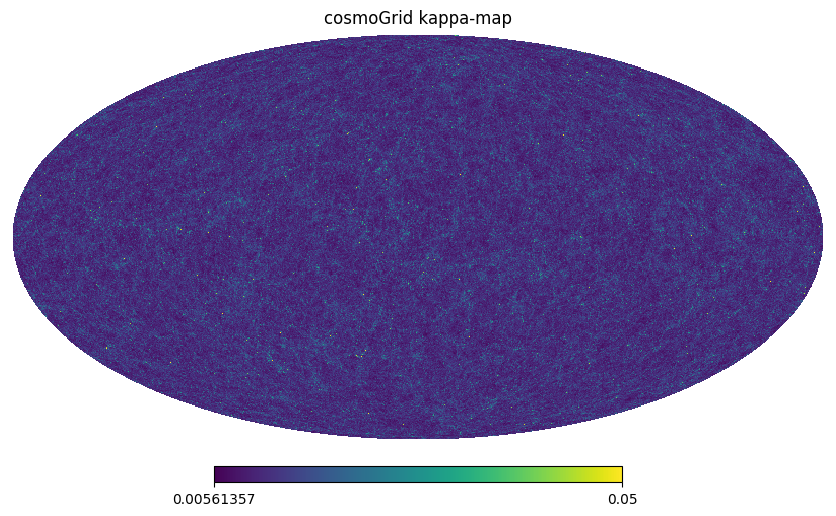

In [6]:
# Display the image.
inmap = kg
hp.mollview(inmap,max=0.05, title='cosmoGrid kappa-map')

In [7]:
ns = gnside(inmap) # get the nside of the map
print("Nside = ", ns) # print the nside
(ae,ab) = hp.map2alm_spin((inmap,inmap), 2) # compute the alm (alm = spherical harmonics coefficients) 
hxe= hp.alm2map(ae,ns,pol=False) # compute the map from the alm
he5= hp.smoothing(hxe, sigma=2./360. * (np.pi*2),pol=False) # smooth the map

Nside =  512


In [8]:
w = mrs_uwttrans(inmap, verbose=True) # compute the wavelet transform of the map

setting the output map dtype to [dtype('<f4')]


CMD =  mrs_uwttrans   -v  ./mr_temp_2024.10.03_12.44.08.fits ./mr_temp_2024.10.03_12.44.08_out.fits
# PARAMETERS: 
# File Name in = ./mr_temp_2024.10.03_12.44.08.fits
# File Name Out = ./mr_temp_2024.10.03_12.44.08_out.fits
Band 1, Norm = 0.831052
Band 2, Norm = 0.110593
Band 3, Norm = 0.0473452
Band 4, Norm = 0.0228206
Band 5, Norm = 0.0113435
Band 6, Norm = 0.00570194
Band 7, Norm = 0.00289302
Band 8, Norm = 0.00231174
Forward Transform
Lmax=1536
NbrScale = 8
BandLimit = 0


<Figure size 640x480 with 0 Axes>

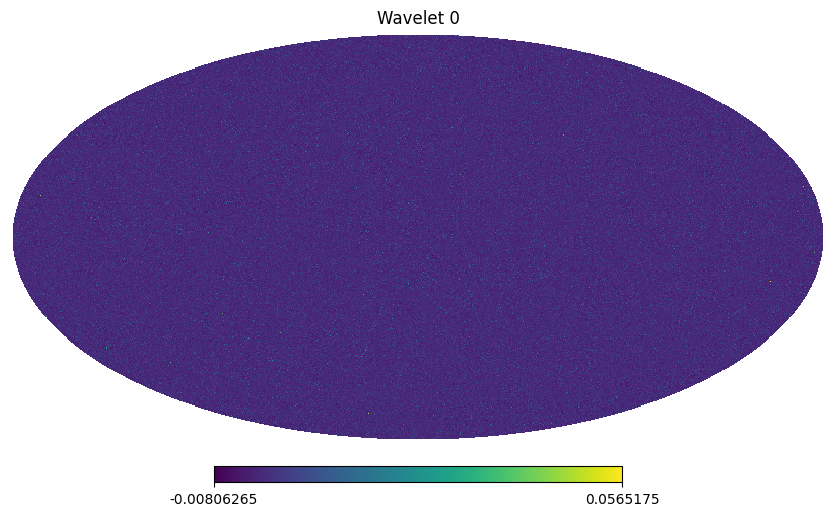

<Figure size 640x480 with 0 Axes>

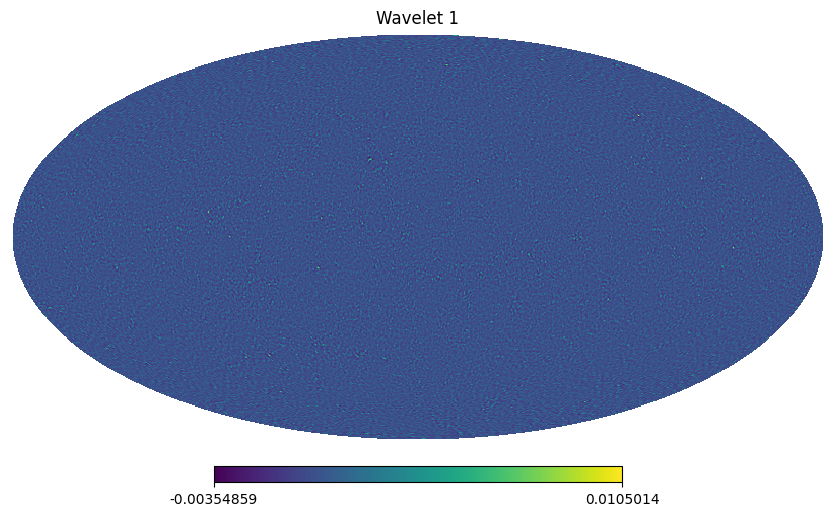

<Figure size 640x480 with 0 Axes>

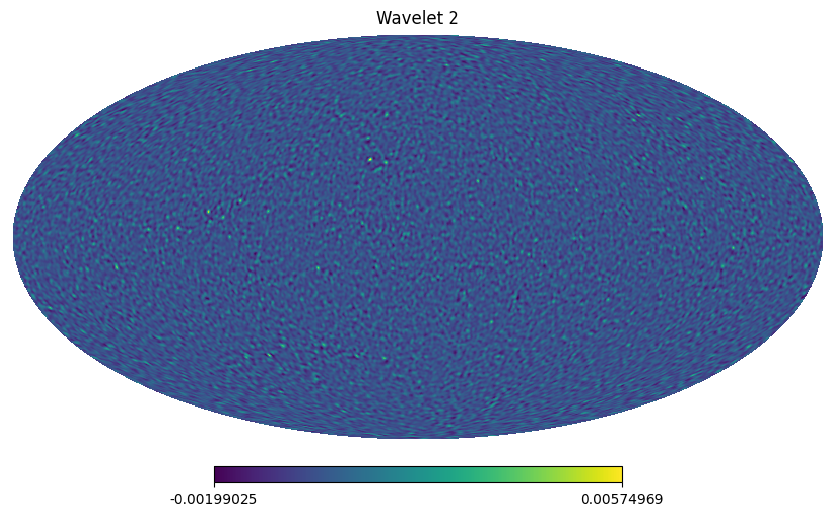

<Figure size 640x480 with 0 Axes>

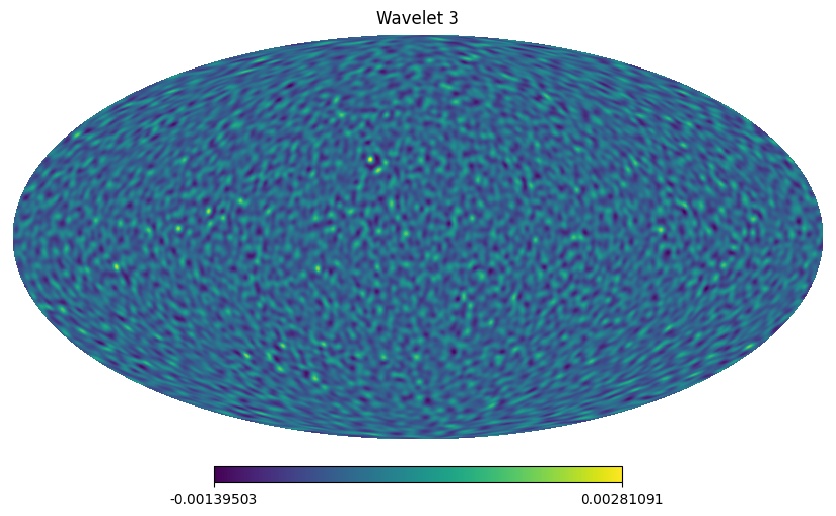

<Figure size 640x480 with 0 Axes>

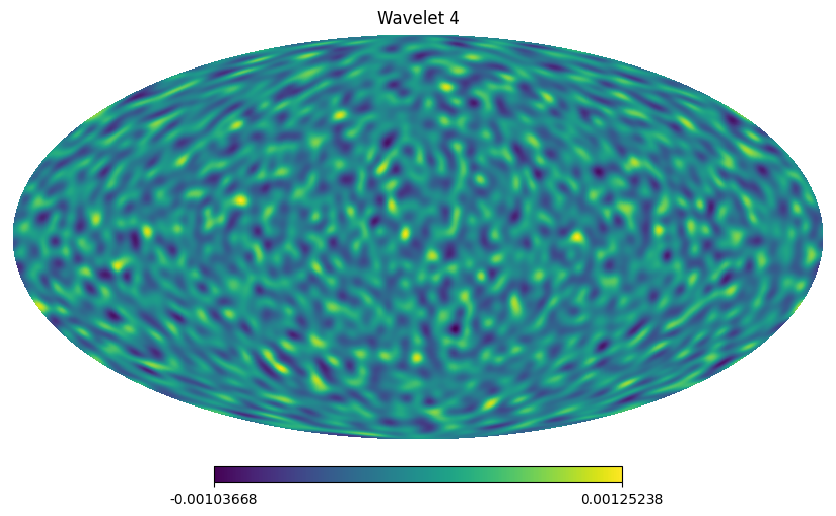

<Figure size 640x480 with 0 Axes>

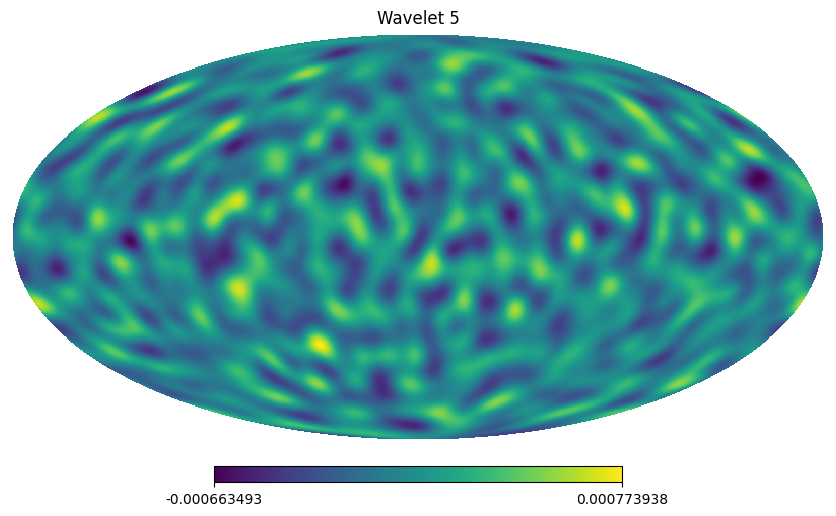

<Figure size 640x480 with 0 Axes>

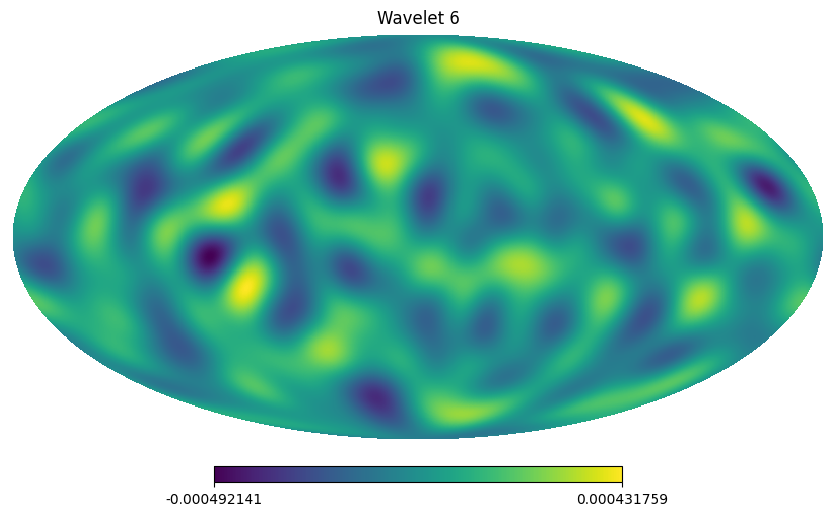

<Figure size 640x480 with 0 Axes>

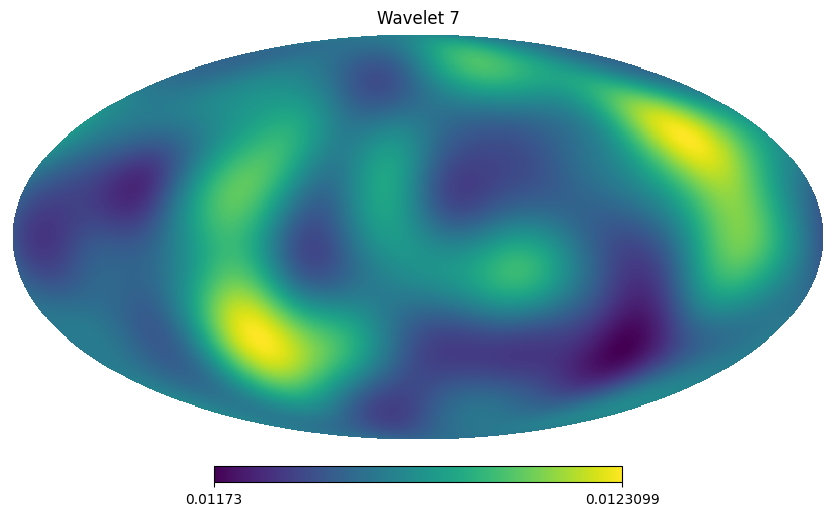

In [9]:
w.shape
for filter_ in range(w.shape[0]):
    fig = plt.figure(filter_)
    hp.mollview(w[filter_, :], title=f'Wavelet {filter_}')
    plt.show()

# $\ell_1$-norm on the sphere

### No baryons

Not fixed min/max SNR

In [ ]:
l1norm_coll = []
bins_coll = []

nbins = 31

WT = mrs_uwttrans(inmap, verbose=True)

for i in range(WT.shape[0]):
    ScaleSNR = WT[i]
    
    min_snr_value = np.min(ScaleSNR)
    max_snr_value = np.max(ScaleSNR)
    
    thresholds_snr = np.linspace(min_snr_value, max_snr_value, nbins + 1)
    bins_snr = 0.5 * (thresholds_snr[:-1] + thresholds_snr[1:])
    
    # Digitize the SNR values into bins
    digitized = np.digitize(ScaleSNR, thresholds_snr)

    # Calculate the l1 norm for each bin
    bin_l1_norm = [
        np.sum(np.abs(ScaleSNR[digitized == j]))
        for j in range(1, len(thresholds_snr))
    ]

    # Store the bins and l1 norms for this scale
    bins_coll.append(bins_snr)
    l1norm_coll.append(bin_l1_norm)

In [14]:
np.array(bins_coll).shape , np.array(l1norm_coll).shape

((8, 31), (8, 31))

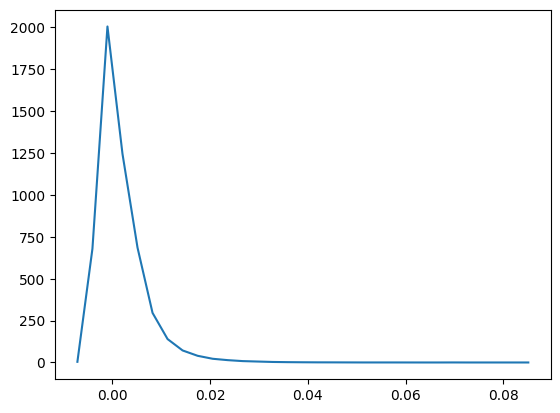

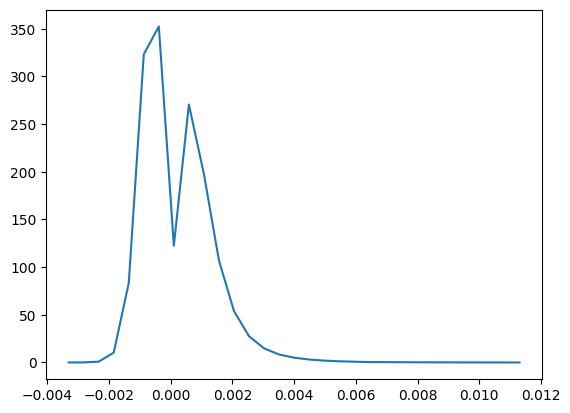

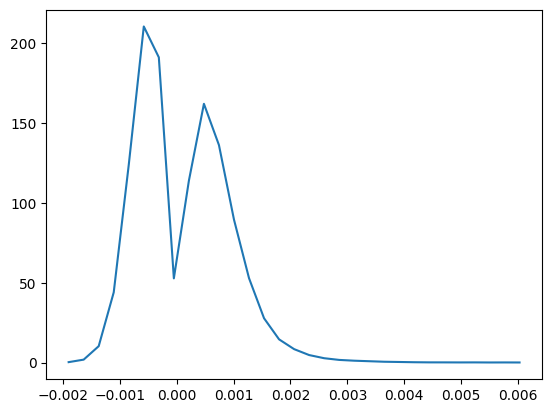

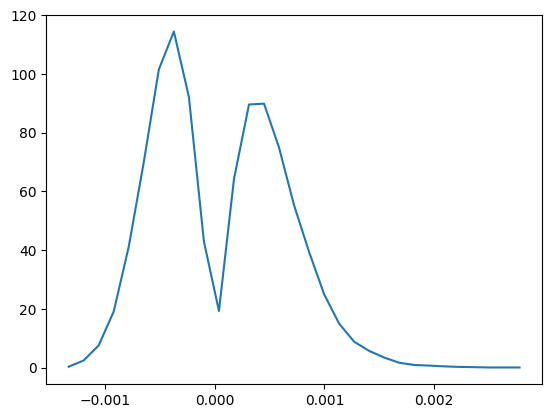

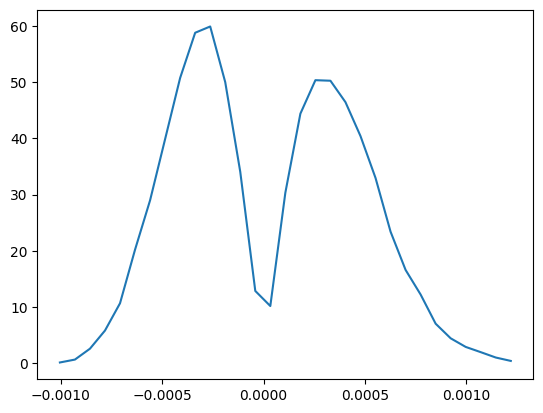

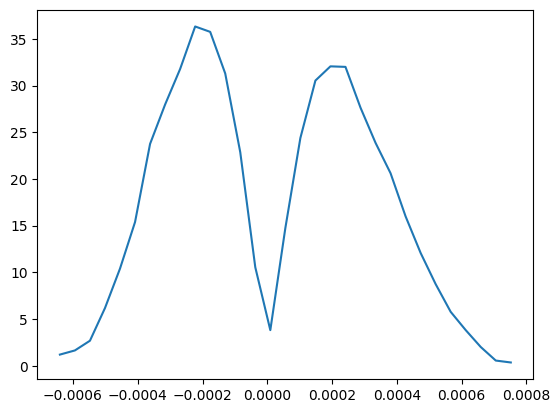

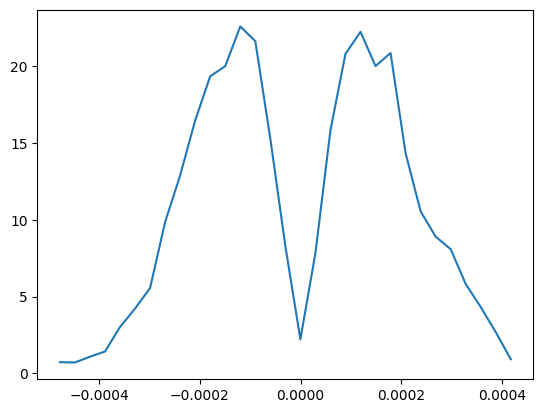

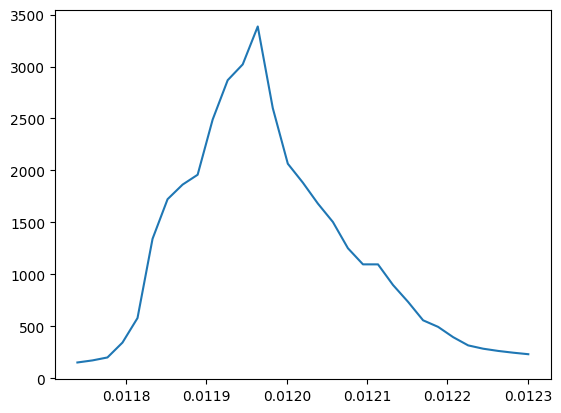

In [15]:
for i in range(8):
    plt.plot(bins_coll[i], l1norm_coll[i])
    plt.show()
    

Fixed SNR

In [16]:
l1norm_coll = []
bins_coll = []

nbins = 40

WT = mrs_uwttrans(inmap, verbose=True)

for i in range(WT.shape[0]):
    ScaleSNR = WT[i]
    
    min_snr_value = -0.004
    max_snr_value = 0.006
    
    thresholds_snr = np.linspace(min_snr_value, max_snr_value, nbins + 1)
    bins_snr = 0.5 * (thresholds_snr[:-1] + thresholds_snr[1:])
    
    # Digitize the SNR values into bins
    digitized = np.digitize(ScaleSNR, thresholds_snr)

    # Calculate the l1 norm for each bin
    bin_l1_norm = [
        np.sum(np.abs(ScaleSNR[digitized == j]))
        for j in range(1, len(thresholds_snr))
    ]

    # Store the bins and l1 norms for this scale
    bins_coll.append(bins_snr)
    l1norm_coll.append(bin_l1_norm)
    
    

setting the output map dtype to [dtype('<f4')]


CMD =  mrs_uwttrans   -v  ./mr_temp_2024.09.09_13.16.33.fits ./mr_temp_2024.09.09_13.16.33_out.fits
# PARAMETERS: 
# File Name in = ./mr_temp_2024.09.09_13.16.33.fits
# File Name Out = ./mr_temp_2024.09.09_13.16.33_out.fits
Band 1, Norm = 0.831052
Band 2, Norm = 0.110593
Band 3, Norm = 0.0473452
Band 4, Norm = 0.0228206
Band 5, Norm = 0.0113435
Band 6, Norm = 0.00570194
Band 7, Norm = 0.00289302
Band 8, Norm = 0.00231174
Forward Transform
Lmax=1536
NbrScale = 8
BandLimit = 0


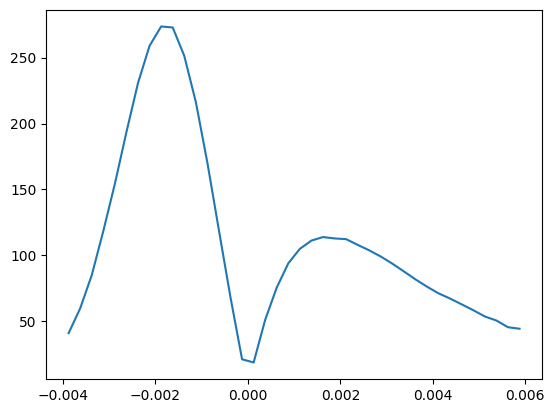

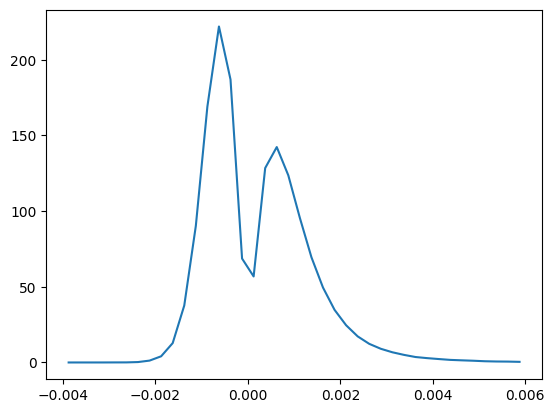

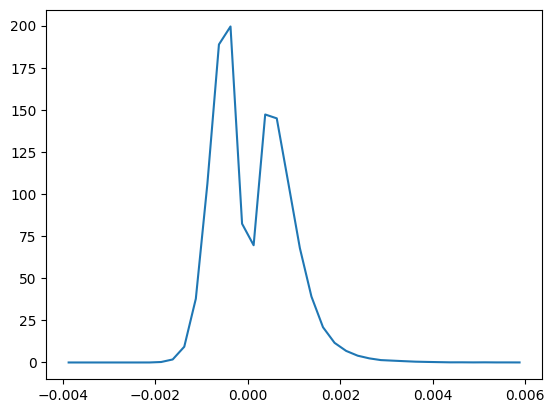

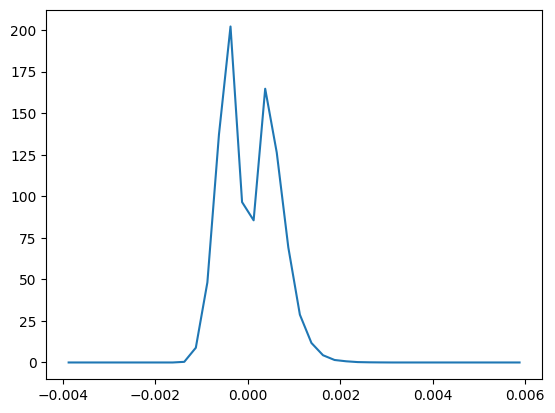

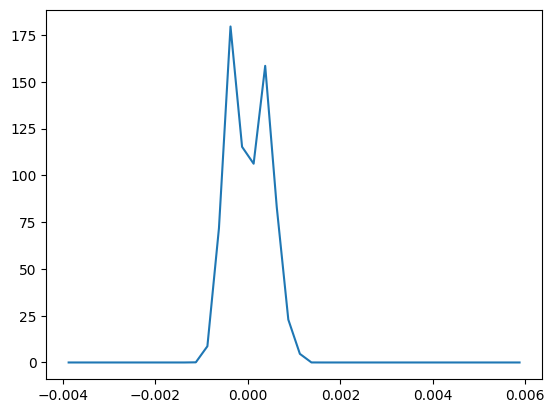

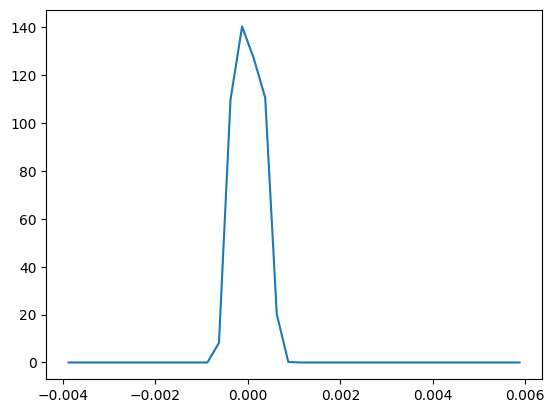

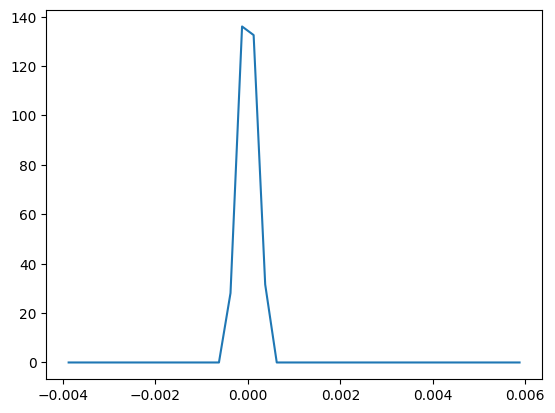

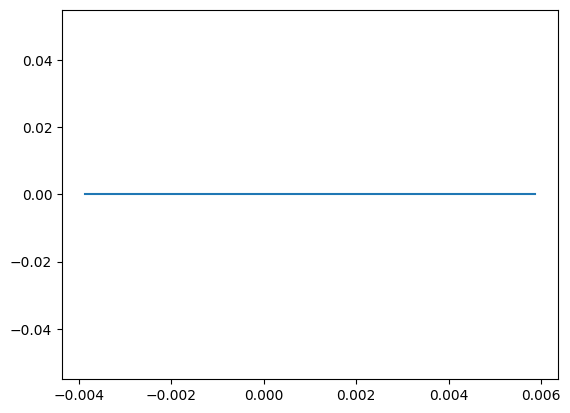

In [17]:
for i in range(8):
    plt.plot(bins_coll[i], l1norm_coll[i])
    plt.show()

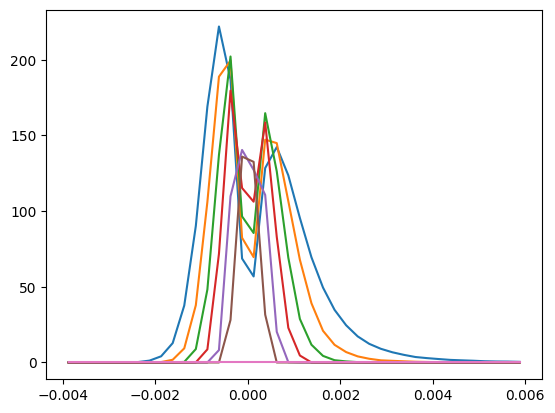

In [51]:
for i in range(7):
    plt.plot(bins_coll[i+1], l1norm_coll[i+1])

### With baryons

In [18]:
import h5py
with h5py.File('/home/tersenov/CosmoGridV1/stage3_forecast/grid/cosmo_000002/perm_0000/projected_probes_maps_baryonified512.h5', 'r') as f:
    kg_b = np.array(f['kg/stage3_lensing1'])

/tmp/ipykernel_3856035/3256561016.py:3: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg_b = np.array(f['kg/stage3_lensing1'])


In [19]:
inmap_b = kg_b

In [1]:
ns = gnside(inmap_b) # get the nside of the map
print("Nside = ", ns) # print the nside
(ae,ab) = hp.map2alm_spin((inmap_b,inmap_b), 2) # compute the alm (alm = spherical harmonics coefficients) 
hxe= hp.alm2map(ae,ns,pol=False) # compute the map from the alm
he5= hp.smoothing(hxe, sigma=2./360. * (np.pi*2),pol=False) # smooth the map

NameError: name 'gnside' is not defined

Not fixed SNR range

In [21]:
l1norm_coll_b = []
bins_coll_b = []

nbins_b = 31

WT_b = mrs_uwttrans(inmap_b, verbose=True)

for i in range(WT_b.shape[0]):
    ScaleSNR = WT_b[i]
    
    min_snr_value = np.min(ScaleSNR)
    max_snr_value = np.max(ScaleSNR)
    
    thresholds_snr = np.linspace(min_snr_value, max_snr_value, nbins + 1)
    bins_snr = 0.5 * (thresholds_snr[:-1] + thresholds_snr[1:])
    
    # Digitize the SNR values into bins
    digitized = np.digitize(ScaleSNR, thresholds_snr)

    # Calculate the l1 norm for each bin
    bin_l1_norm = [
        np.sum(np.abs(ScaleSNR[digitized == j]))
        for j in range(1, len(thresholds_snr))
    ]

    # Store the bins and l1 norms for this scale
    bins_coll_b.append(bins_snr)
    l1norm_coll_b.append(bin_l1_norm)

setting the output map dtype to [dtype('<f4')]


CMD =  mrs_uwttrans   -v  ./mr_temp_2024.09.09_13.28.18.fits ./mr_temp_2024.09.09_13.28.18_out.fits
# PARAMETERS: 
# File Name in = ./mr_temp_2024.09.09_13.28.18.fits
# File Name Out = ./mr_temp_2024.09.09_13.28.18_out.fits
Band 1, Norm = 0.831052
Band 2, Norm = 0.110593
Band 3, Norm = 0.0473452
Band 4, Norm = 0.0228206
Band 5, Norm = 0.0113435
Band 6, Norm = 0.00570194
Band 7, Norm = 0.00289302
Band 8, Norm = 0.00231174
Forward Transform
Lmax=1536
NbrScale = 8
BandLimit = 0


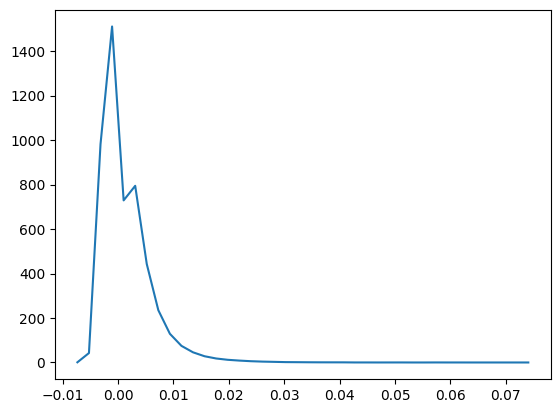

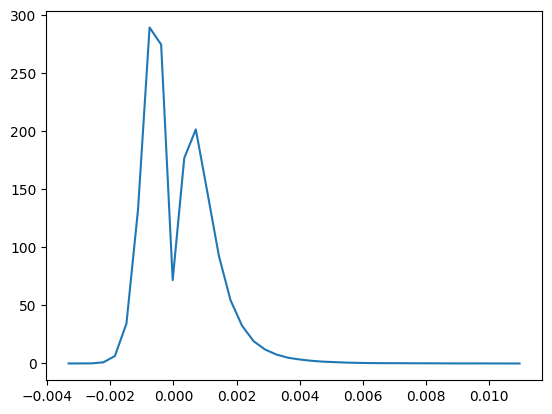

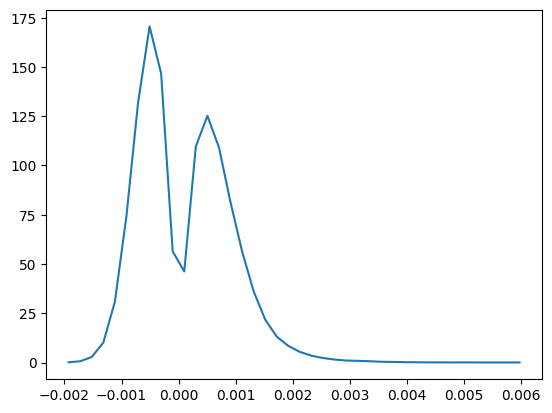

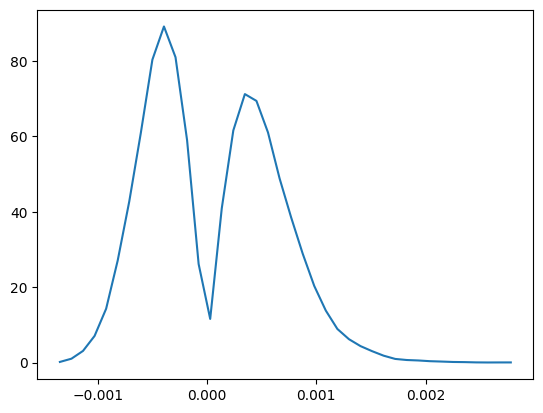

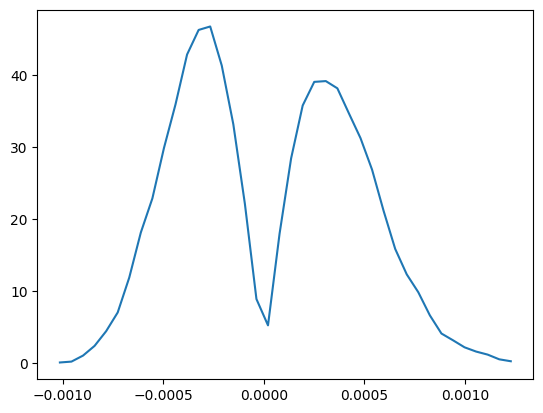

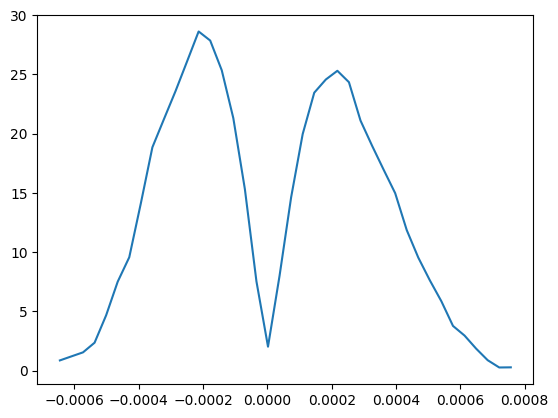

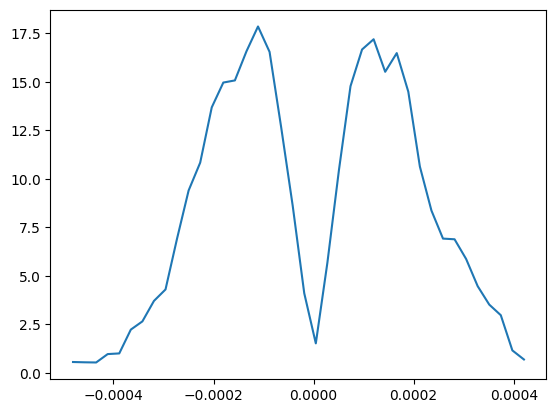

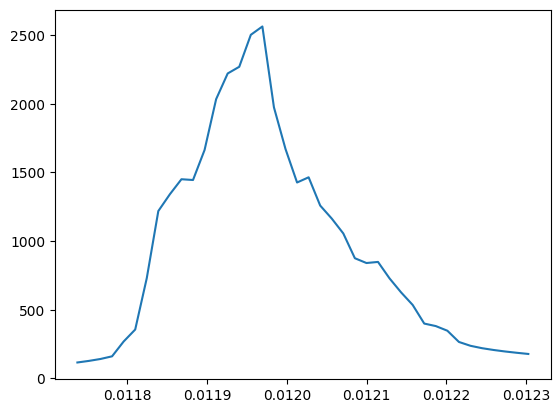

In [22]:
for i in range(8):
    plt.plot(bins_coll_b[i], l1norm_coll_b[i])
    plt.show()

Fixed SNR range

In [23]:
l1norm_coll_b = []
bins_coll_b = []

nbins = 40

WT = mrs_uwttrans(inmap_b, verbose=True)

for i in range(WT.shape[0]):
    ScaleSNR = WT[i]
    
    min_snr_value = -0.004
    max_snr_value = 0.006
    
    thresholds_snr = np.linspace(min_snr_value, max_snr_value, nbins + 1)
    bins_snr = 0.5 * (thresholds_snr[:-1] + thresholds_snr[1:])
    
    # Digitize the SNR values into bins
    digitized = np.digitize(ScaleSNR, thresholds_snr)

    # Calculate the l1 norm for each bin
    bin_l1_norm = [
        np.sum(np.abs(ScaleSNR[digitized == j]))
        for j in range(1, len(thresholds_snr))
    ]

    # Store the bins and l1 norms for this scale
    bins_coll_b.append(bins_snr)
    l1norm_coll_b.append(bin_l1_norm)

setting the output map dtype to [dtype('<f4')]


CMD =  mrs_uwttrans   -v  ./mr_temp_2024.09.09_13.54.38.fits ./mr_temp_2024.09.09_13.54.38_out.fits
# PARAMETERS: 
# File Name in = ./mr_temp_2024.09.09_13.54.38.fits
# File Name Out = ./mr_temp_2024.09.09_13.54.38_out.fits
Band 1, Norm = 0.831052
Band 2, Norm = 0.110593
Band 3, Norm = 0.0473452
Band 4, Norm = 0.0228206
Band 5, Norm = 0.0113435
Band 6, Norm = 0.00570194
Band 7, Norm = 0.00289302
Band 8, Norm = 0.00231174
Forward Transform
Lmax=1536
NbrScale = 8
BandLimit = 0


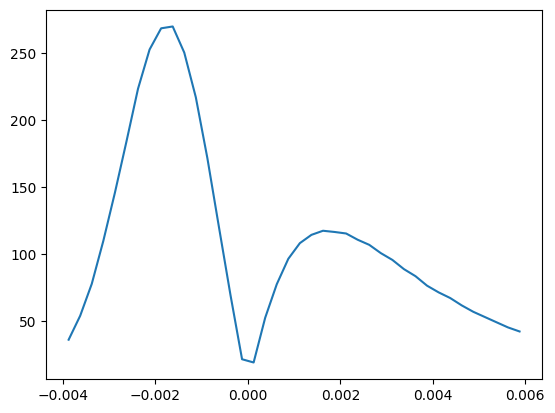

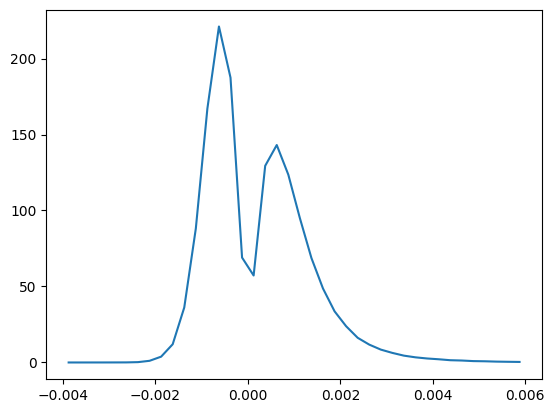

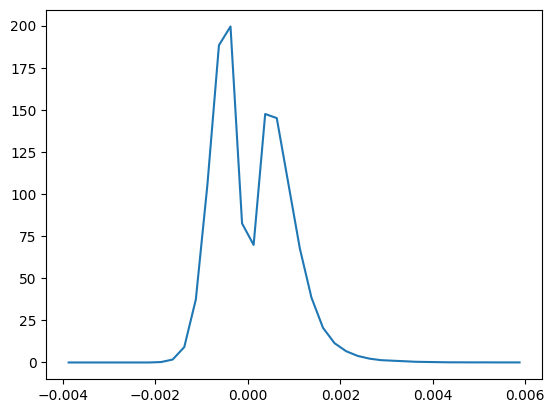

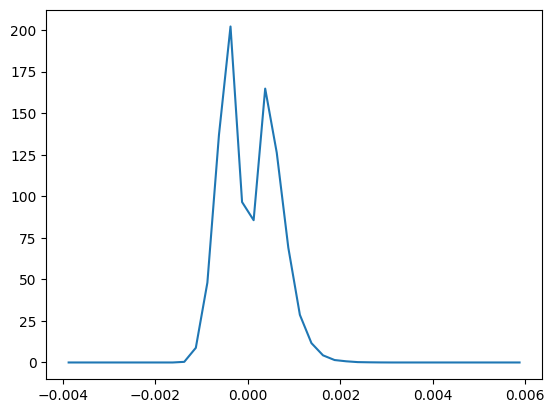

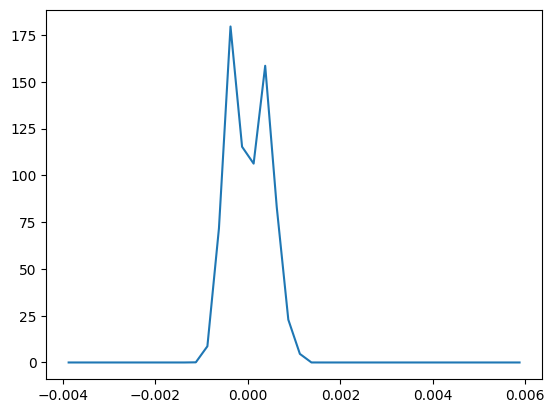

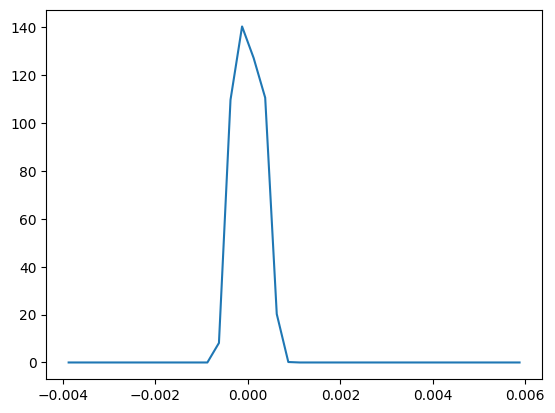

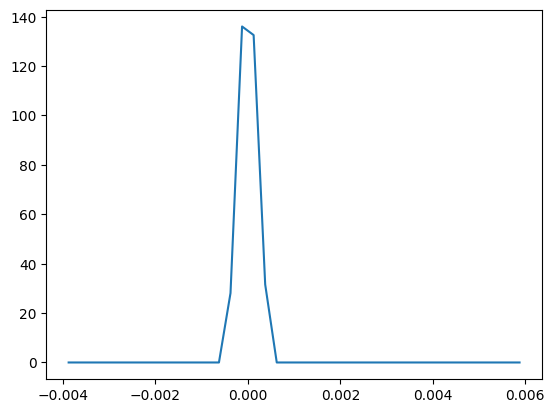

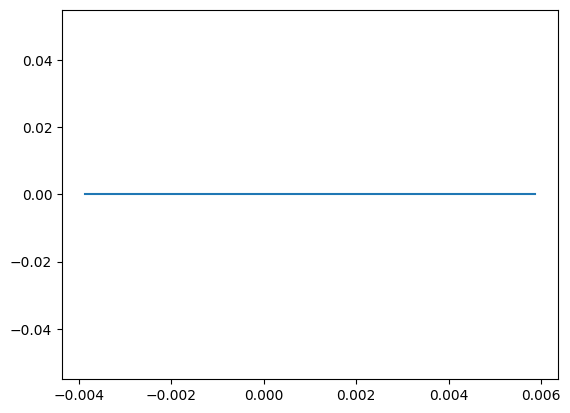

In [24]:
for i in range(8):
    plt.plot(bins_coll_b[i], l1norm_coll_b[i])
    plt.show()

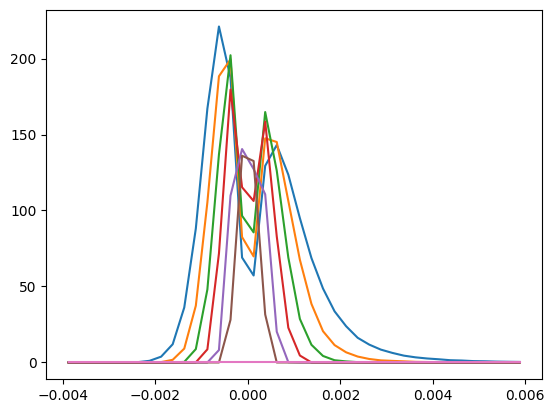

In [25]:
for i in range(7):
    plt.plot(bins_coll_b[i+1], l1norm_coll_b[i+1])

In [27]:
l1norm_coll_b = np.array(l1norm_coll_b)
l1norm_coll = np.array(l1norm_coll)

In [28]:
# define fractional difference between the l1-norm of the barionified and the non-baryonic maps
fractional_difference0 = (l1norm_coll_b[0] - l1norm_coll[0]) / l1norm_coll[0]

# calculate the mse between the l1-norm of the barionified and the non-baryonic maps
mse = np.mean((l1norm_coll_b - l1norm_coll)**2, axis=1)

In [29]:
mse.shape

(8,)

/tmp/ipykernel_3856035/762916352.py:1: RuntimeWarning: divide by zero encountered in log
  plt.plot(np.log(mse))


Text(0.5, 1.0, 'Logarithm of the Mean Squared Error of the L1-norms')

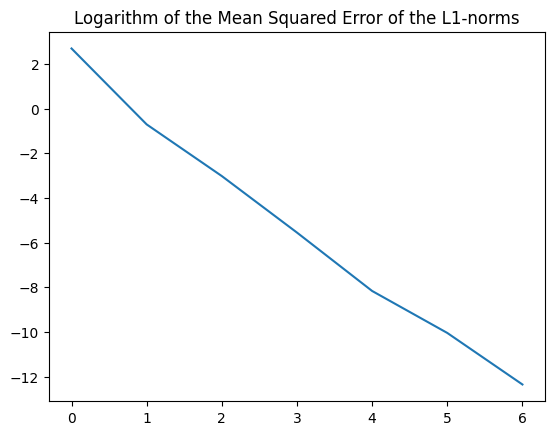

In [31]:
plt.plot(np.log(mse))
plt.title('Logarithm of the Mean Squared Error of the L1-norms')

In [12]:
def get_wtl1_sphere(Map, nscales, nbins=None, Mask=None, min_snr=None, max_snr=None):

    # Set default for nbins if not provided
    if nbins is None:
        nbins = 40

    # Perform undecimated wavelet transform on the spherical map
    WT = mrs_uwttrans(Map, verbose=False)

    # Initialize lists to collect the l1 norm and bins
    l1norm_coll = []
    bins_coll = []

    # Loop through each scale of the wavelet transform
    for i in range(nscales):
        ScaleSNR = WT[i]  # Accessing the coefficients for the i-th scale

        # Apply the mask if provided
        if Mask is not None:
            ind = np.where(Mask == 0)
            ScaleSNR = ScaleSNR[ind]

        # Set the minimum and maximum SNR values based on inputs or defaults
        min_snr_value = min_snr if min_snr is not None else np.min(ScaleSNR)
        max_snr_value = max_snr if max_snr is not None else np.max(ScaleSNR)

        # Define SNR thresholds and bins
        thresholds_snr = np.linspace(min_snr_value, max_snr_value, nbins + 1)
        bins_snr = 0.5 * (thresholds_snr[:-1] + thresholds_snr[1:])

        # Digitize the SNR values into bins
        digitized = np.digitize(ScaleSNR, thresholds_snr)

        # Calculate the l1 norm for each bin
        bin_l1_norm = [
            np.sum(np.abs(ScaleSNR[digitized == j]))
            for j in range(1, len(thresholds_snr))
        ]

        # Store the bins and l1 norms for this scale
        bins_coll.append(bins_snr)
        l1norm_coll.append(bin_l1_norm)

    # Return the bins and l1 norms for each scale
    return np.array(bins_coll), np.array(l1norm_coll)

In [25]:
bins_coll_b, l1norm_coll_b = get_wtl1_sphere(inmap_b, nscales=8, nbins=None, Mask=None, min_snr=-0.004, max_snr=0.006)

NameError: name 'inmap_b' is not defined

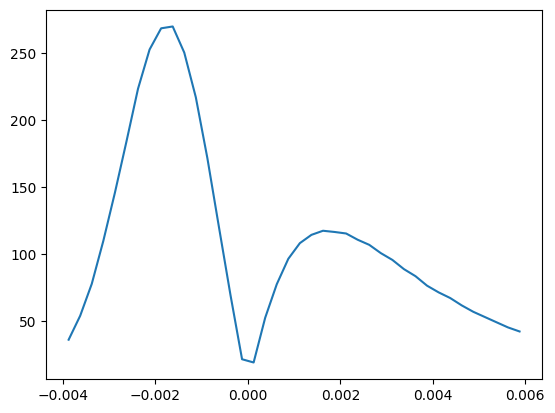

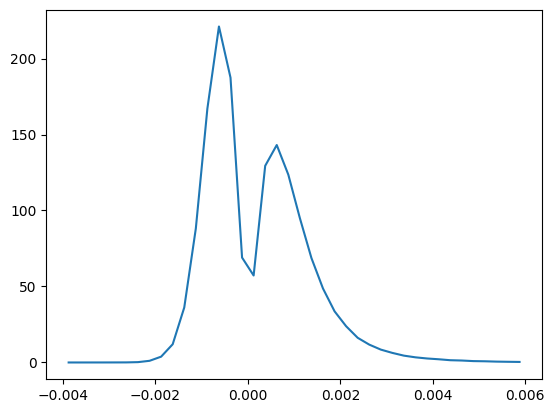

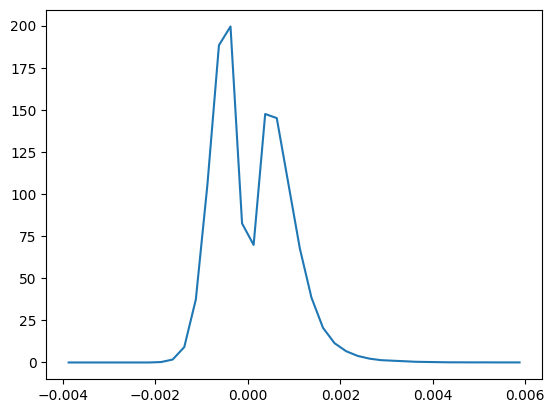

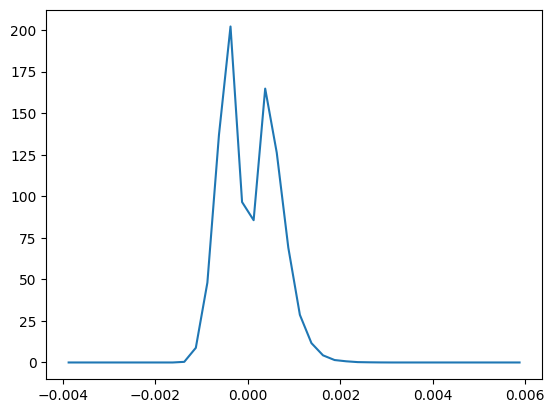

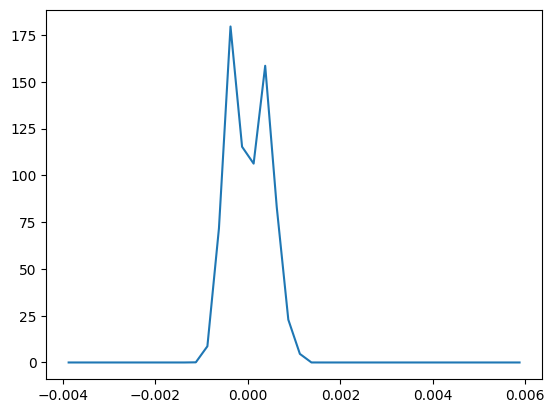

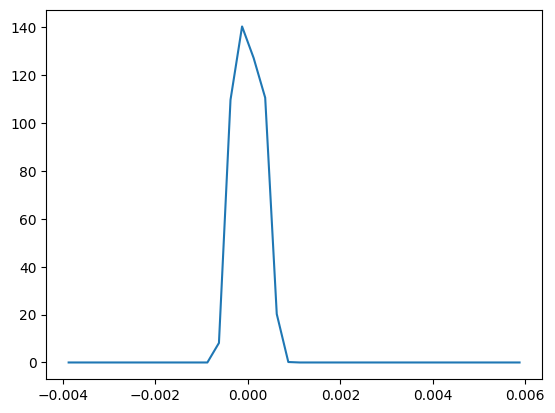

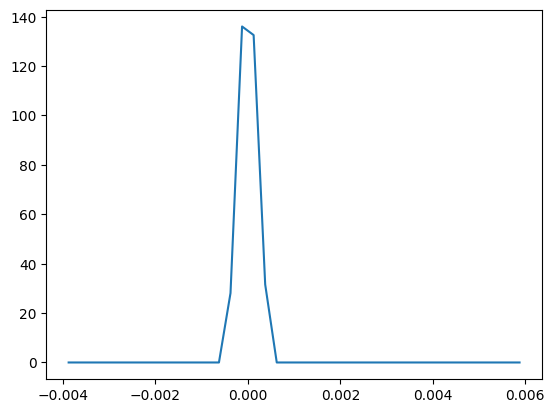

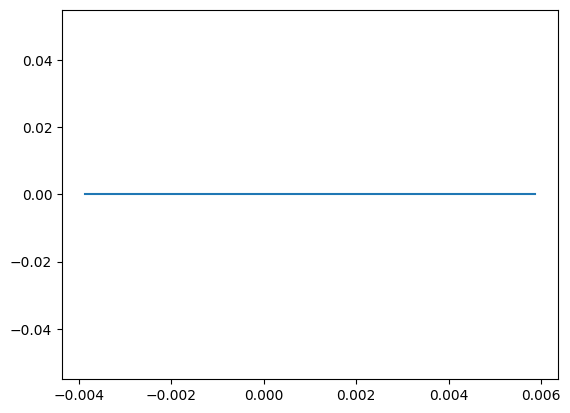

In [34]:
for i in range(8):
    plt.plot(bins_coll_b[i], l1norm_coll_b[i])
    plt.show()

## $\ell_1$-norm variance

In [13]:
# Parameters
n_permutations = 200  # Number of permutations (0000 to 0199)
id_zbin = 0  # Redshift bin index, e.g., 0 for the first bin
smooth_arcmin = 0

Non-baryonic

In [36]:
# Store l1-norms for all permutations
l1_list_kg = []

for perm_index in range (n_permutations):
    # Extract and process the kg map for the current permutation
    kg = get_bin_map(id_zbin, perm_index, with_baryons=False, smooth_arcmin=0)
    
    # Calculate the l1-norm on the maps
    bins_coll, l1norm_coll = get_wtl1_sphere(kg, nscales=8, nbins=None, Mask=None, min_snr=-0.004, max_snr=0.006)
    
    # store the l1-norm
    l1_list_kg.append(l1norm_coll)

NameError: name 'get_bin_map' is not defined

In [1]:
l1_list_kg_array = np.array(l1_list_kg)
l1_list_kg_array.shape

NameError: name 'np' is not defined

In [ ]:
# Initialize a list to store covariance matrices for each scale
cov_matrices = []

# Loop through each scale
for i in range(8):
    # Extract l1-norms for the i-th scale across all permutations
    scale_l1_norms = l1_list_kg_array[:, i, :]  # Shape: (n_permutations, nbins)
    
    # Calculate covariance matrix for the i-th scale (covariance over the bins)
    cov_matrix = np.cov(scale_l1_norms, rowvar=False)  # Shape: (nbins, nbins)
    
    # Store the covariance matrix for this scale
    cov_matrices.append(cov_matrix)

# Convert the list of covariance matrices to a NumPy array
cov_matrices = np.array(cov_matrices)  # Shape: (nscales, nbins, nbins)

In [ ]:
cov_matrices.shape

(8, 40, 40)

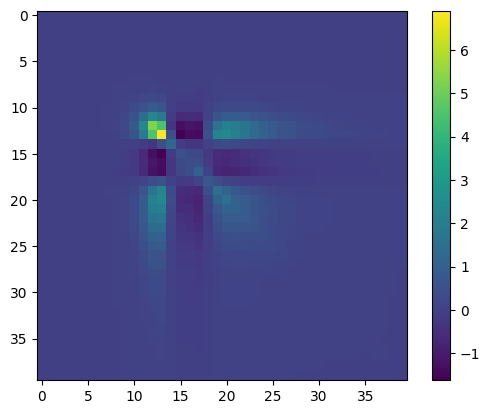

In [ ]:
# plot covariance
plt.imshow(cov_matrices[2])
plt.colorbar()

Bayonified

In [ ]:
# Store l1-norms for all permutations
l1_list_kg_b = []

for perm_index in range (n_permutations):
    # Extract and process the kg map for the current permutation
    kg_b = get_bin_map(id_zbin, perm_index, with_baryons=True, smooth_arcmin=0)
    
    # Calculate the l1-norm on the maps
    bins_coll_b, l1norm_coll_b = get_wtl1_sphere(kg_b, nscales=8, nbins=None, Mask=None, min_snr=-0.004, max_snr=0.006)
    
    # store the l1-norm
    l1_list_kg_b.append(l1norm_coll_b)

/tmp/ipykernel_2126121/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]


/tmp/ipykernel_2126121/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]
/tmp/ipykernel_2126121/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]
/tmp/ipykernel_2126121/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]
/tmp/ipykernel_2126121/2495378694.py:5: DeprecationWarning: __array__ implem

In [ ]:
l1_list_kg_array_b = np.array(l1_list_kg_b)
l1_list_kg_array_b.shape

(200, 8, 40)

In [ ]:
# Initialize a list to store covariance matrices for each scale
cov_matrices_b = []

# Loop through each scale
for i in range(8):
    # Extract l1-norms for the i-th scale across all permutations
    scale_l1_norms_b = l1_list_kg_array_b[:, i, :]  # Shape: (n_permutations, nbins)
    
    # Calculate covariance matrix for the i-th scale (covariance over the bins)
    cov_matrix_b = np.cov(scale_l1_norms_b, rowvar=False)  # Shape: (nbins, nbins)
    
    # Store the covariance matrix for this scale
    cov_matrices_b.append(cov_matrix_b)

# Convert the list of covariance matrices to a NumPy array
cov_matrices_b = np.array(cov_matrices_b)  # Shape: (nscales, nbins, nbins)

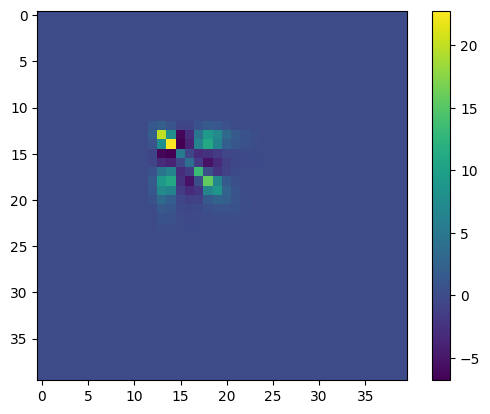

In [ ]:
# plot covariance
plt.imshow(cov_matrices_b[4])
plt.colorbar()

In [ ]:
# check if cov_matrices_b is the same as cov_matrices
np.allclose(cov_matrices_b, cov_matrices)

False

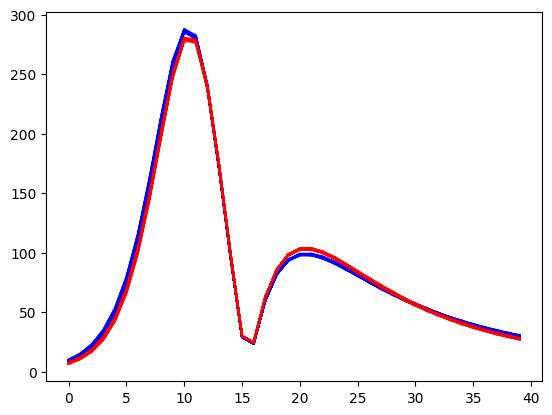

In [ ]:
# plot all the scaled cls
for i in range(n_permutations):
    plt.plot(l1_list_kg_array[i,0], alpha=0.1, color='blue')
for i in range(n_permutations):
    plt.plot(l1_list_kg_array_b[i,0], alpha=0.1, color='red')

## Compare bar vs non-bar l1

In [15]:
id_zbin = 0
perm_index = 200

In [16]:
kg_bar = get_bin_map(id_zbin, perm_index, with_baryons=True, smooth_arcmin=0)

# Calculate the l1-norm on the maps
bins_coll_bar, l1norm_coll_bar = get_wtl1_sphere(kg_bar, nscales=8, nbins=None, Mask=None, min_snr=-0.004, max_snr=0.006)

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = '/home/tersenov/CosmoGridV1/stage3_forecast/fiducial/cosmo_fiducial/perm_0200/projected_probes_maps_baryonified512.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [17]:
kg_nobar = get_bin_map(id_zbin, perm_index, with_baryons=False, smooth_arcmin=0)

# Calculate the l1-norm on the maps
bins_coll_nobar, l1norm_coll_nobar = get_wtl1_sphere(kg_nobar, nscales=8, nbins=None, Mask=None, min_snr=-0.004, max_snr=0.006)

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = '/home/tersenov/CosmoGridV1/stage3_forecast/fiducial/cosmo_fiducial/perm_0200/projected_probes_maps_nobaryons512.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

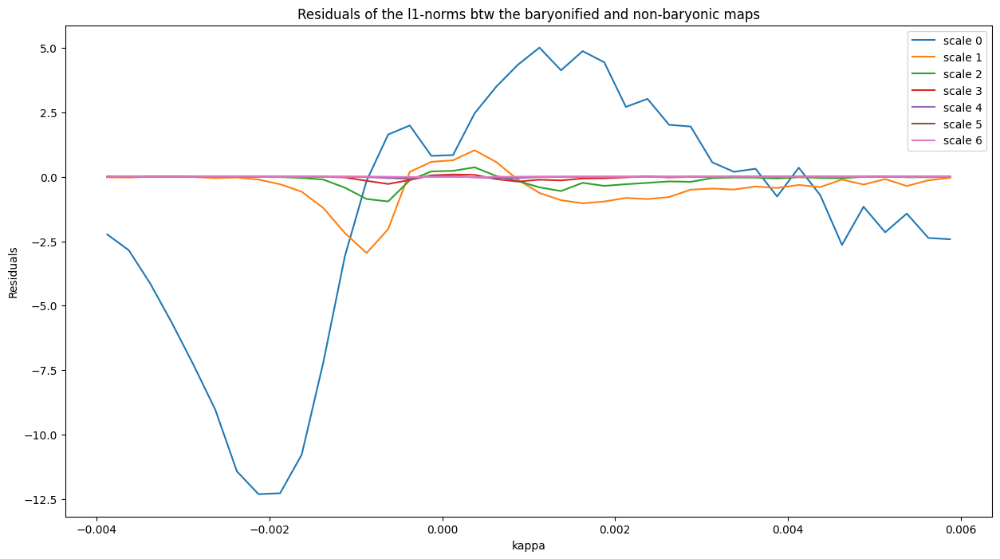

In [ ]:
plt.figure(figsize=(15,8))
# plot the residuals of the l1-norms 
for i in range(7):
    plt.plot(bins_coll_bar[i], l1norm_coll_bar[i] - l1norm_coll_nobar[i], label=f'scale {i}')
    # plt.show()
plt.title('Residuals of the l1-norms btw the baryonified and non-baryonic maps')
plt.xlabel('kappa')
plt.ylabel('Residuals')
plt.legend()

In [18]:
epsilon = 1e-10  # Small constant to avoid division by zero

# Calculate fractional difference
frac_diff = np.abs(l1norm_coll_b - l1norm_coll) / (np.abs(l1norm_coll_b) + epsilon)  # Shape: (40, 8)

NameError: name 'l1norm_coll_b' is not defined

In [ ]:
frac_diff[0,:].shape

(40,)

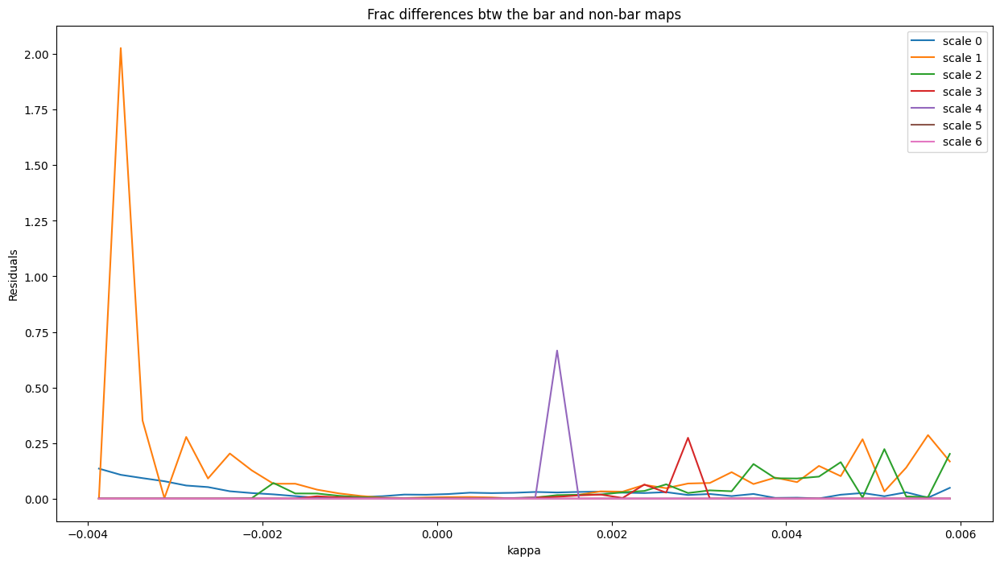

In [ ]:
plt.figure(figsize=(15,8))
# plot the residuals of the l1-norms 
for i in range(7):
    plt.plot(bins_coll_bar[i], frac_diff[i,:], label=f'scale {i}')
    # plt.show()
plt.title('Frac differences btw the bar and non-bar maps')
plt.xlabel('kappa')
plt.ylabel('Residuals')
plt.legend()

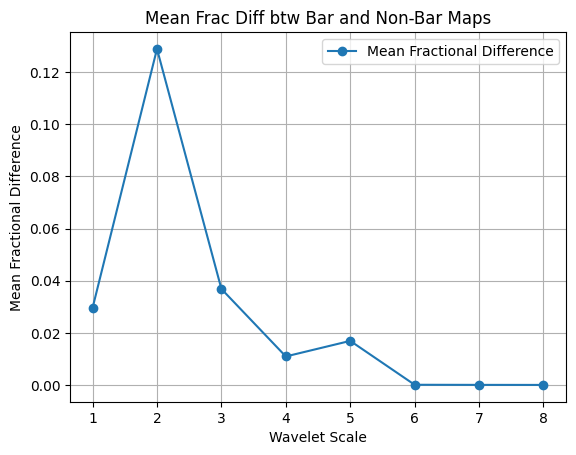

In [ ]:
# Calculate mean fractional difference across bins for each scale
frac_diff_mean = np.mean(frac_diff, axis=1)  

# Plot the mean fractional difference as a function of wavelet scale
wavelet_scales = np.arange(1, len(frac_diff_mean) + 1)

plt.plot(wavelet_scales, frac_diff_mean, 'o-', label='Mean Fractional Difference')
plt.xlabel('Wavelet Scale')
plt.ylabel('Mean Fractional Difference')
plt.title('Mean Frac Diff btw Bar and Non-Bar Maps')
plt.grid(True)
plt.legend()
plt.show()

<ErrorbarContainer object of 3 artists>

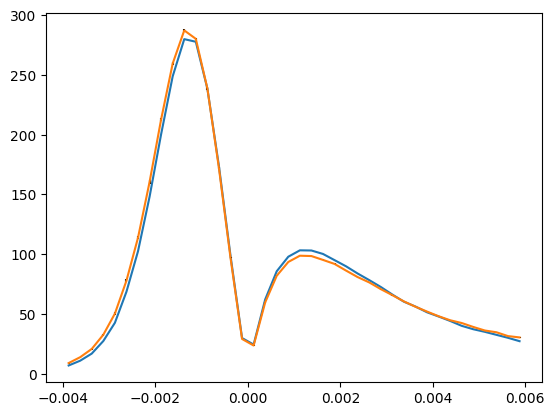

In [ ]:
plt.plot(bins_coll_nobar[0], l1norm_coll_bar[0])
plt.errorbar(bins_coll_nobar[0], l1norm_coll_nobar[0], yerr=np.sqrt(np.diag(cov_matrices[0])), ecolor='k')

In [19]:
epsilon = 1e-10
frac_diff = np.mean(np.abs(l1norm_coll_bar - l1norm_coll_nobar) / (np.abs(l1norm_coll_bar)+epsilon), axis=1)

NameError: name 'l1norm_coll_bar' is not defined

/tmp/ipykernel_2126121/3271644593.py:1: RuntimeWarning: divide by zero encountered in log
  plt.plot(np.log(frac_diff))


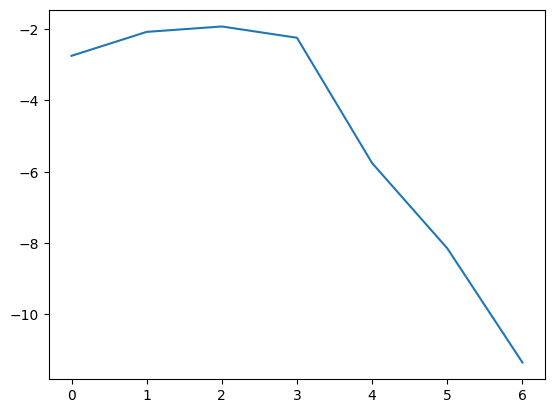

In [196]:
plt.plot(np.log(frac_diff))

## Do same, averaging over all realizations

In [20]:
# Parameters
n_permutations = 200  # Number of permutations (0000 to 0199)
id_zbin = 0  # Redshift bin index, e.g., 0 for the first bin
smooth_arcmin = 0

Non-baryonic

In [24]:
# Store l1-norms for all permutations
l1_list_kg = []

for perm_index in range (n_permutations):
    # Extract and process the kg map for the current permutation
    kg = get_bin_map(id_zbin, perm_index, with_baryons=False, smooth_arcmin=0)
    
    # Calculate the l1-norm on the maps
    bins_coll, l1norm_coll = get_wtl1_sphere(kg, nscales=8, nbins=None, Mask=None, min_snr=-0.004, max_snr=0.006)
    
    # store the l1-norm
    l1_list_kg.append(l1norm_coll)

/tmp/ipykernel_32673/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])


NameError: name 'get_wtl1_sphere' is not defined

In [ ]:
l1_list_kg_array = np.array(l1_list_kg)
l1_list_kg_array.shape

(200, 8, 40)

Bayonified

In [ ]:
# Store l1-norms for all permutations
l1_list_kg_b = []

for perm_index in range (n_permutations):
    # Extract and process the kg map for the current permutation
    kg_b = get_bin_map(id_zbin, perm_index, with_baryons=True, smooth_arcmin=0)
    
    # Calculate the l1-norm on the maps
    bins_coll_b, l1norm_coll_b = get_wtl1_sphere(kg_b, nscales=8, nbins=None, Mask=None, min_snr=-0.004, max_snr=0.006)
    
    # store the l1-norm
    l1_list_kg_b.append(l1norm_coll_b)

/tmp/ipykernel_3856035/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]
/tmp/ipykernel_3856035/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]
/tmp/ipykernel_3856035/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]
/tmp/ipykernel_3856035/2495378694.py:5: DeprecationWarning: __array__ implem

/tmp/ipykernel_3856035/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]
/tmp/ipykernel_3856035/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]
/tmp/ipykernel_3856035/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]
/tmp/ipykernel_3856035/2495378694.py:5: DeprecationWarning: __array__ implem

In [21]:
l1_list_kg_array_b = np.array(l1_list_kg_b)
l1_list_kg_array_b.shape

NameError: name 'l1_list_kg_b' is not defined

In [14]:
# load the lists
l1_list_kg_array_b = np.load("./l1_list_kg_array_b.npy")
l1_list_kg_array = np.load("./l1_list_kg_array.npy")

In [15]:
# calculate the means over the realizations
mean_l1_list_kg = np.mean(l1_list_kg_array, axis=0)
mean_l1_list_kg_b = np.mean(l1_list_kg_array_b, axis=0)


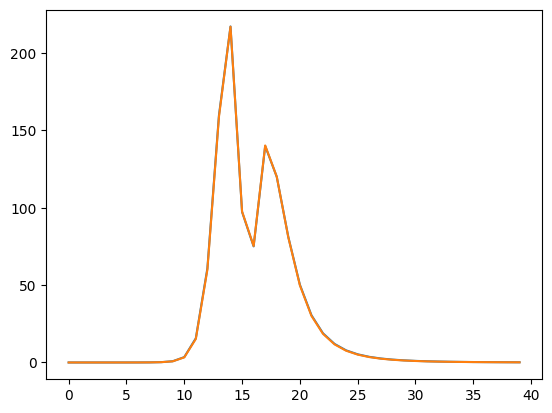

In [19]:
plt.plot(mean_l1_list_kg[2,:])
plt.plot(mean_l1_list_kg_b[2,:])

In [20]:
#average over the 200 realizations
mean_l1_list_kg = np.mean(l1_list_kg_array, axis=0)
mean_l1_list_kg.shape

(8, 40)

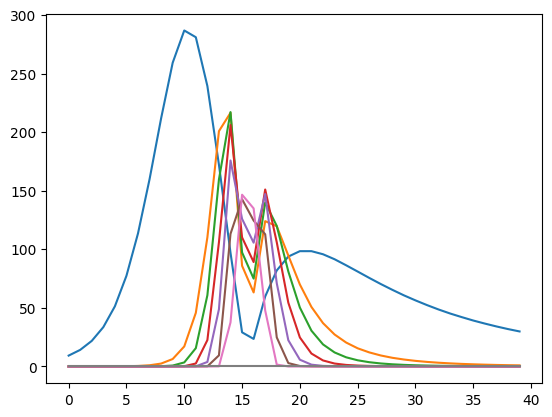

In [ ]:
for i in range(8):
    plt.plot(mean_l1_list_kg[i,:])

In [27]:
with h5py.File('/home/tersenov/CosmoGridV1/stage3_forecast/grid/cosmo_000002/perm_0000/projected_probes_maps_baryonified512.h5', 'r') as f:
    kg_b = np.array(f['kg/stage3_lensing1'])
bins_coll_b, _ = get_wtl1_sphere(kg_b, nscales=8, nbins=None, Mask=None, min_snr=-0.004, max_snr=0.006)

/tmp/ipykernel_313985/621297485.py:2: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg_b = np.array(f['kg/stage3_lensing1'])
setting the output map dtype to [dtype('<f4')]


In [28]:
bins_coll_b.shape

(8, 40)

In [43]:
# Calculate fractional difference for each permutation
frac_diff_list = []
epsilon = 10e-3

for i in range(n_permutations):
    l1norm_b = l1_list_kg_array_b[i]  # Shape (8, 40)
    l1norm_nobar = l1_list_kg_array[i]  # Shape (8, 40)
    print('l1norm_b shape:', l1norm_b.shape) 

    # Calculate fractional difference for this realization
    frac_diff = np.abs(l1norm_b - l1norm_nobar) / (np.abs(l1norm_b) + epsilon)  # Shape (8, 40)
    frac_diff_list.append(frac_diff)
    print('frac_diff shape:', frac_diff.shape) 

# Convert to array for easier manipulation
frac_diff_array = np.array(frac_diff_list)  # Shape (200, 8, 40)
print('frac_diff_array shape:', frac_diff_array.shape) 

# Calculate mean and standard deviation across realizations (axis=0 for averaging over realizations)
frac_diff_mean = np.mean(frac_diff_array, axis=0)  # Shape (8, 40)
frac_diff_std = np.std(frac_diff_array, axis=0)  # Shape (8, 40)
print('frac_diff_mean shape:', frac_diff_mean.shape) 
print('frac_diff_std shape:', frac_diff_std.shape) 

l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 

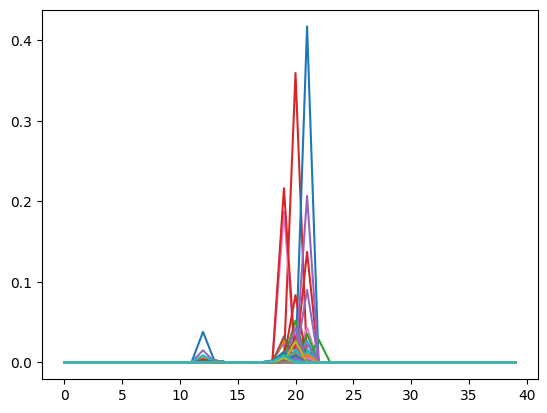

In [44]:
for i in range(n_permutations):
    plt.plot(frac_diff_array[i,5,:])

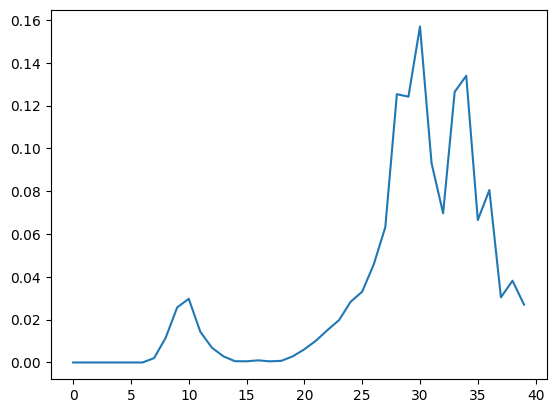

In [45]:
plt.plot(frac_diff_mean[3,:])

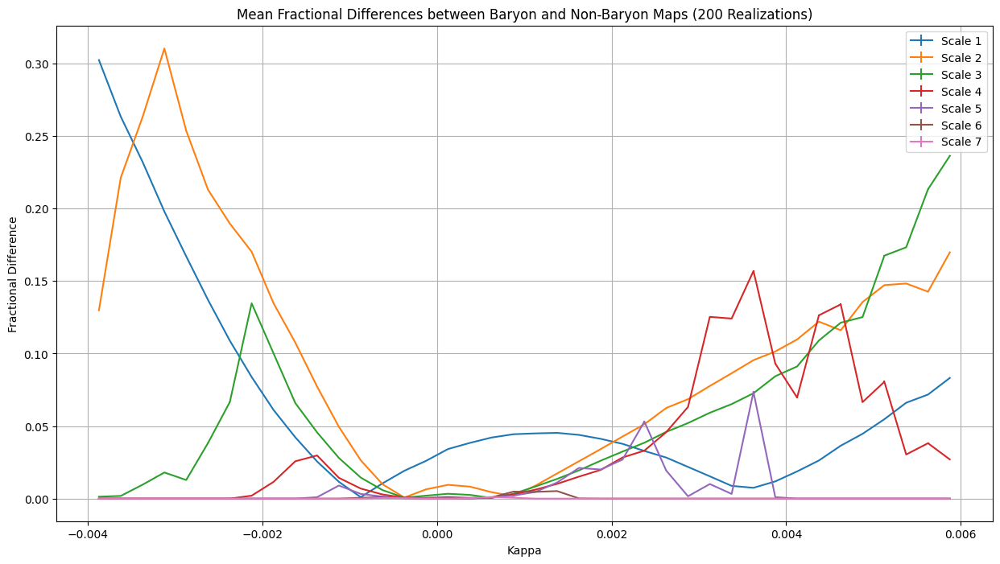

In [47]:
# Plot the fractional difference across bins for each scale
plt.figure(figsize=(15, 8))

# Loop over scales (8 scales in total)
for i in range(7):
    plt.errorbar(bins_coll_b[i,:], frac_diff_mean[i,:], yerr=frac_diff_std[i, :]/1000, label=f'Scale {i + 1}')

plt.title('Mean Fractional Differences between Baryon and Non-Baryon Maps (200 Realizations)')
plt.xlabel('Kappa')
plt.ylabel('Fractional Difference')
plt.legend()
plt.grid(True)
plt.show()

# Normalized $\ell_1$-norm on the sphere

In [11]:
def get_norm_wtl1_sphere(Map, nscales, nbins=None, Mask=None, min_snr=None, max_snr=None):

    # Set default for nbins if not provided
    if nbins is None:
        nbins = 40

    # Perform undecimated wavelet transform on the spherical map
    WT = mrs_uwttrans(Map, verbose=False)
    energy_per_scale = [np.sum(WT[i]**2) for i in range(nscales)]  # Energy per scale
    # # Print the energy for each wavelet scale
    # print("Energy per scale (before normalization):")
    # for i, energy in enumerate(energy_per_scale):
    #     print(f"Scale {i+1}: {energy}")

    # Initialize lists to collect the l1 norm and bins
    l1norm_coll = []
    bins_coll = []

      # Loop through each scale of the wavelet transform
    for i in range(nscales):
        ScaleCoeffs = WT[i]  # Accessing the coefficients for the i-th scale

        # Apply the mask if provided
        if Mask is not None:
            ind = np.where(Mask == 0)
            ScaleCoeffs = ScaleCoeffs[ind]

        # Normalize the wavelet scale to the same energy level
        energy = np.sum(ScaleCoeffs**2)
        normalization_factor = np.sqrt(energy)
        ScaleCoeffs_normalized = ScaleCoeffs / normalization_factor  
        
        # # Print the energy for each wavelet scale
        # energy_per_scale_af = [np.sum(ScaleCoeffs_normalized[i]**2) for i in range(nscales)]  # Energy per scale    
        # print("Energy per scale (after normalization):")
        # for i, energy in enumerate(energy_per_scale_af):
        #     print(f"Scale {i+1}: {energy}")
        

        # Set the minimum and maximum values based on inputs or defaults
        min_val = min_snr if min_snr is not None else np.min(ScaleCoeffs_normalized)
        max_val = max_snr if max_snr is not None else np.max(ScaleCoeffs_normalized)

        # Define thresholds and bins
        thresholds = np.linspace(min_val, max_val, nbins + 1)
        bins = 0.5 * (thresholds[:-1] + thresholds[1:])

        # Digitize the values into bins
        digitized = np.digitize(ScaleCoeffs_normalized, thresholds)

        # Calculate the l1 norm for each bin
        bin_l1_norm = [
            np.sum(np.abs(ScaleCoeffs_normalized[digitized == j]))
            for j in range(1, len(thresholds))
        ]

        # Store the bins and l1 norms for this scale
        bins_coll.append(bins)
        l1norm_coll.append(bin_l1_norm)

    # Return the bins and l1 norms for each scale
    return np.array(bins_coll), np.array(l1norm_coll)

In [13]:
bins_ener, l1norm_ener = get_norm_wtl1_sphere(kg, nscales=8, nbins=None, Mask=None, min_snr=-0.004, max_snr=0.006)

setting the output map dtype to [dtype('<f4')]


Energy per scale (before normalization):
Scale 1: 18.317085652697866
Scale 2: 1.423481338210299
Scale 3: 0.8354504818459589
Scale 4: 0.4989040909158555
Scale 5: 0.28379791184006403
Scale 6: 0.13436569070051077
Scale 7: 0.05472808447443256
Scale 8: 451.64042729777947
Energy per scale (after normalization):
Scale 1: 2.6177782682941446e-07
Scale 2: 2.4724817032723395e-07
Scale 3: 5.122323278900102e-09
Scale 4: 1.0392866786843105e-07
Scale 5: 8.354139653075803e-08
Scale 6: 3.386012358924251e-07
Scale 7: 1.7222078776681597e-09
Scale 8: 9.293376730853182e-08
Energy per scale (after normalization):
Scale 1: 2.1121072716038478e-07
Scale 2: 5.089492808582632e-07
Scale 3: 5.065788978121108e-07
Scale 4: 2.993990393426648e-07
Scale 5: 3.670908394737661e-08
Scale 6: 1.1885318809563421e-08
Scale 7: 1.971278899645908e-07
Scale 8: 6.530715519434755e-07
Energy per scale (after normalization):
Scale 1: 1.3414726170585603e-06
Scale 2: 9.054860194200106e-07
Scale 3: 3.3108834606583825e-07
Scale 4: 5.76722

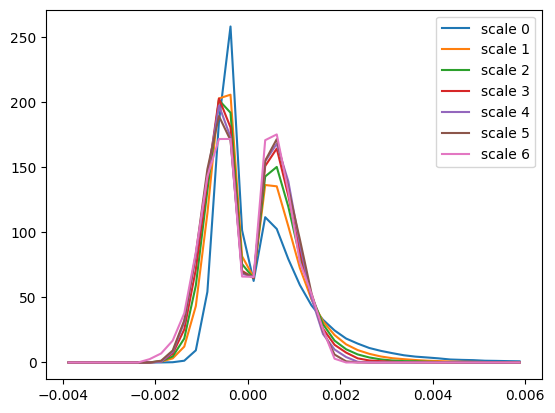

In [14]:
for i in range(7):
    plt.plot(bins_ener[i], l1norm_ener[i], label=f'scale {i}')
plt.legend()    

Test

In [15]:

# Set the desired number of pixels (nside determines the map resolution)
nside = 512  # Adjust the resolution as needed

# Generate Gaussian noise on the sphere with mean 0 and std 1
np.random.seed(42)  # For reproducibility
noise_map_sphere = np.random.normal(0, 1, hp.nside2npix(nside))

<Figure size 2000x1000 with 0 Axes>

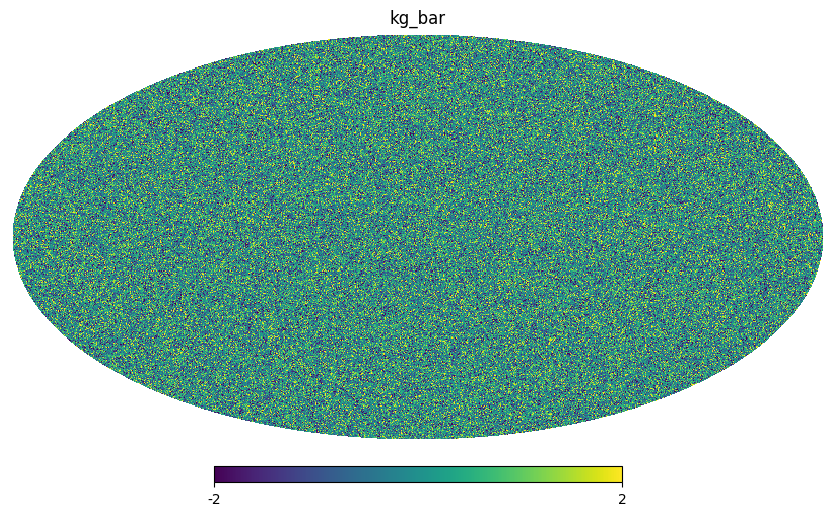

In [16]:
# plot the map
plt.figure(figsize = (20, 10))
hp.mollview(noise_map_sphere, cmap='viridis', title='kg_bar', min=-2, max=2)

In [17]:
# Number of wavelet scales
nscales = 8

# Apply the wavelet transform and compute the l1-norms on the spherical map
bins_coll, l1norm_coll = get_norm_wtl1_sphere(noise_map_sphere, nscales=nscales)

setting the output map dtype to [dtype('float64')]


Energy per scale (before normalization):
Scale 1: 2958444.4547630567
Scale 2: 33965.45637747256
Scale 3: 8506.426066151482
Scale 4: 2139.21237759668
Scale 5: 554.6391678100512
Scale 6: 134.03173294811077
Scale 7: 35.669280877346374
Scale 8: 20.42538292149748
Energy per scale (after normalization):
Scale 1: 1.3513970628115151e-07
Scale 2: 1.4944299009984907e-09
Scale 3: 1.6041929573882993e-07
Scale 4: 8.788897328629213e-07
Scale 5: 1.0413491218045294e-09
Scale 6: 9.568038984656143e-10
Scale 7: 9.60455097263286e-07
Scale 8: 2.1822706392741852e-07
Energy per scale (after normalization):
Scale 1: 1.5606958179925876e-07
Scale 2: 3.611831293204581e-09
Scale 3: 4.768515453974566e-09
Scale 4: 3.749837150234471e-08
Scale 5: 4.0483790354920344e-07
Scale 6: 4.015687213167636e-07
Scale 7: 6.161340019889255e-08
Scale 8: 1.3342752071999099e-08
Energy per scale (after normalization):
Scale 1: 5.490338402322665e-07
Scale 2: 4.035318945206581e-07
Scale 3: 3.0854895633962783e-07
Scale 4: 4.0254442784852

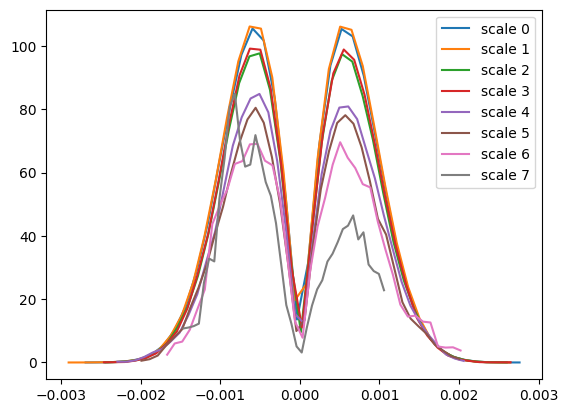

In [18]:
for i in range(8):
    plt.plot(bins_coll[i], l1norm_coll[i], label=f'scale {i}')
plt.legend()    

Non-baryonic

In [ ]:
# Store l1-norms for all permutations
l1_list_kg = []

for perm_index in range (n_permutations):
    # Extract and process the kg map for the current permutation
    kg = get_bin_map(id_zbin, perm_index, with_baryons=False, smooth_arcmin=0)
    
    # Calculate the l1-norm on the maps
    bins_coll, l1norm_coll = get_norm_wtl1_sphere(kg, nscales=8, nbins=None, Mask=None, min_snr=-0.004, max_snr=0.006)
    
    # store the l1-norm
    l1_list_kg.append(l1norm_coll)

In [22]:
l1_list_kg_array = np.array(l1_list_kg)
l1_list_kg_array.shape

(200, 8, 40)

In [23]:
np.save("l1_list_kg_array_normalized", l1_list_kg_array)

Bayonified

In [25]:
# Store l1-norms for all permutations
l1_list_kg_b = []

for perm_index in range (n_permutations):
    # Extract and process the kg map for the current permutation
    kg_b = get_bin_map(id_zbin, perm_index, with_baryons=True, smooth_arcmin=0)
    
    # Calculate the l1-norm on the maps
    bins_coll_b, l1norm_coll_b = get_norm_wtl1_sphere(kg_b, nscales=8, nbins=None, Mask=None, min_snr=-0.004, max_snr=0.006)
    
    # store the l1-norm
    l1_list_kg_b.append(l1norm_coll_b)

/tmp/ipykernel_3022515/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]
/tmp/ipykernel_3022515/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]
/tmp/ipykernel_3022515/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]


/tmp/ipykernel_3022515/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]
/tmp/ipykernel_3022515/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]
/tmp/ipykernel_3022515/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])
setting the output map dtype to [dtype('<f4')]
/tmp/ipykernel_3022515/2495378694.py:5: DeprecationWarning: __array__ implem

In [26]:
l1_list_kg_array_b = np.array(l1_list_kg_b)
l1_list_kg_array_b.shape

(200, 8, 40)

In [27]:
np.save("l1_list_kg_array_b_normalized", l1_list_kg_array_b)

In [28]:
# calculate the means over the realizations
mean_l1_list_kg = np.mean(l1_list_kg_array, axis=0)
mean_l1_list_kg_b = np.mean(l1_list_kg_array_b, axis=0)

In [41]:
# calculate the variance over the realizations
var_l1_list_kg = np.std(l1_list_kg_array, axis=0)
var_l1_list_kg_b = np.std(l1_list_kg_array_b, axis=0)

In [42]:
var_l1_list_kg.shape

(8, 40)

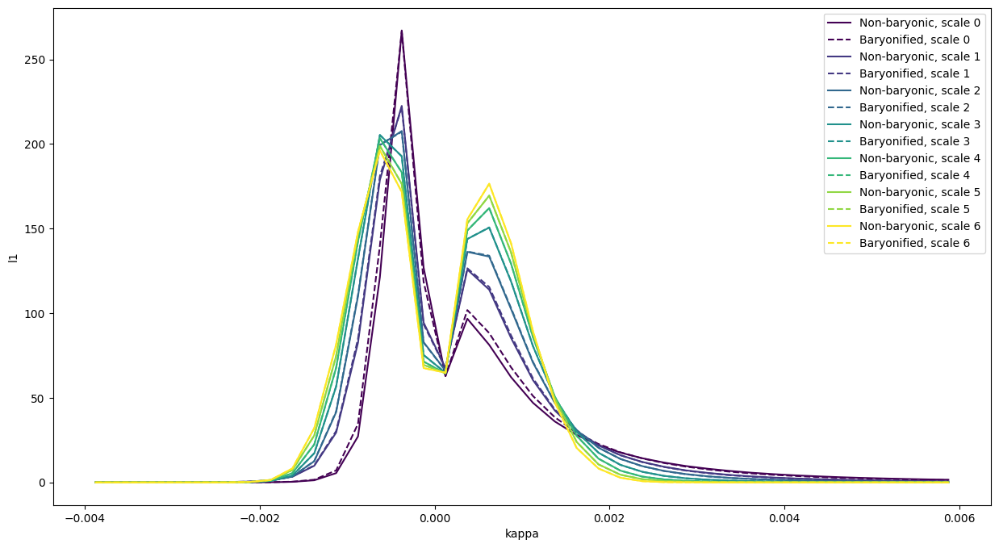

In [40]:
plt.figure(figsize=(15,8))
colors = plt.cm.viridis(np.linspace(0, 1, 7))  # Using viridis colormap, but you can choose others
# plot the residuals of the l1-norms 
for i in range(7):
    plt.plot(bins_coll_b[i], mean_l1_list_kg[i], color=colors[i], label=f'Non-baryonic, scale {i}', linestyle='-') 
    plt.plot(bins_coll_b[i], mean_l1_list_kg_b[i], color=colors[i], label=f'Baryonified, scale {i}', linestyle='--')
    # plt.show()
plt.xlabel('kappa')
plt.ylabel('l1')
plt.legend()

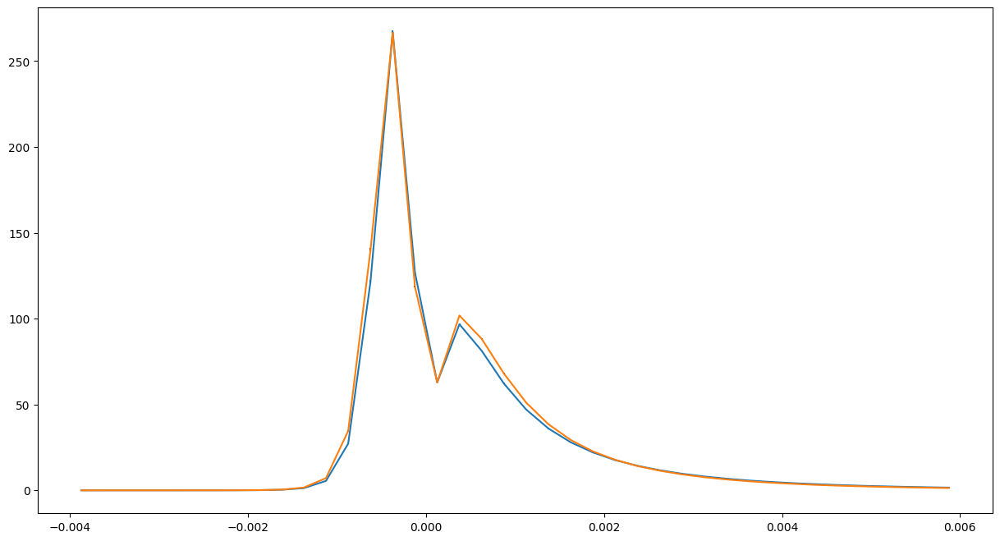

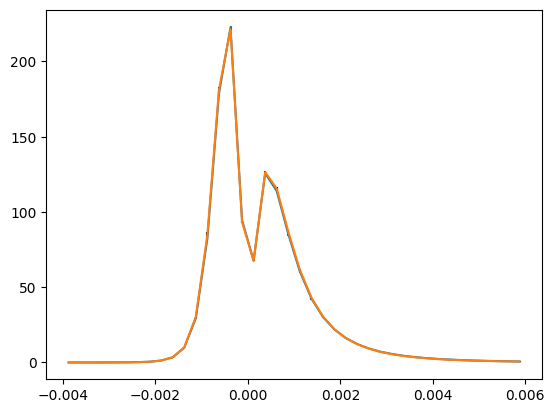

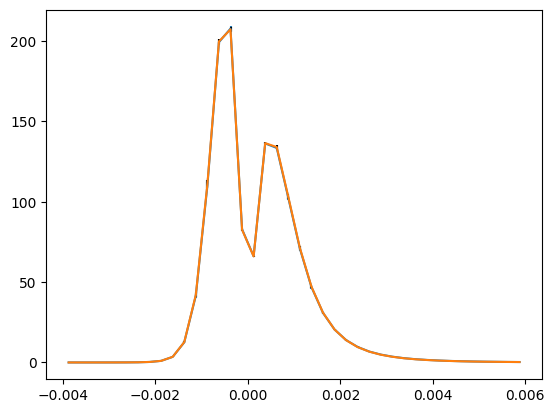

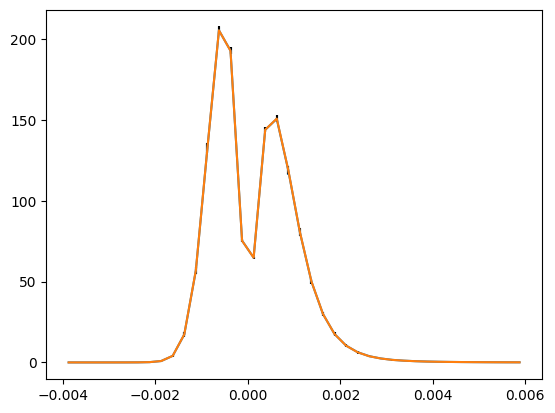

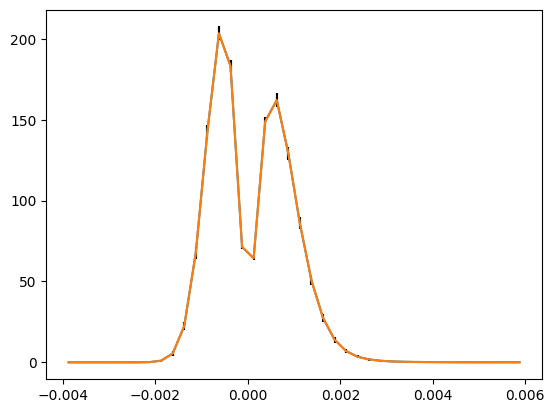

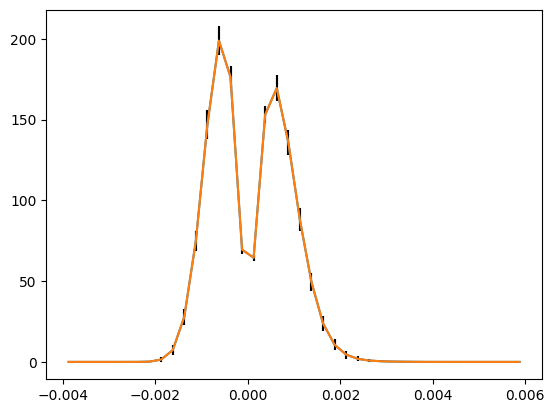

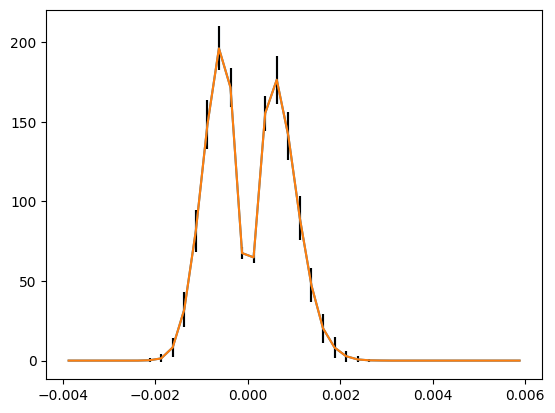

/tmp/ipykernel_3022515/601386595.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


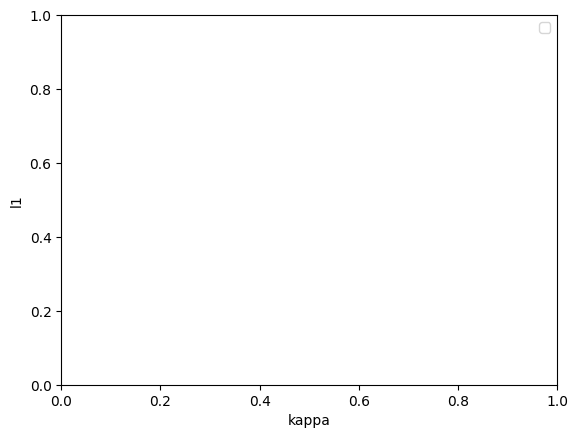

In [52]:
plt.figure(figsize=(15,8))
colors = plt.cm.viridis(np.linspace(0, 1, 7))  # Using viridis colormap, but you can choose others
# plot the residuals of the l1-norms 
for i in range(7):
    plt.errorbar(bins_coll_b[i], mean_l1_list_kg[i], yerr=var_l1_list_kg[i])
    plt.errorbar(bins_coll_b[i], mean_l1_list_kg_b[i], yerr=var_l1_list_kg_b[i], ecolor='k')
    plt.show()
plt.xlabel('kappa')
plt.ylabel('l1')
plt.legend()

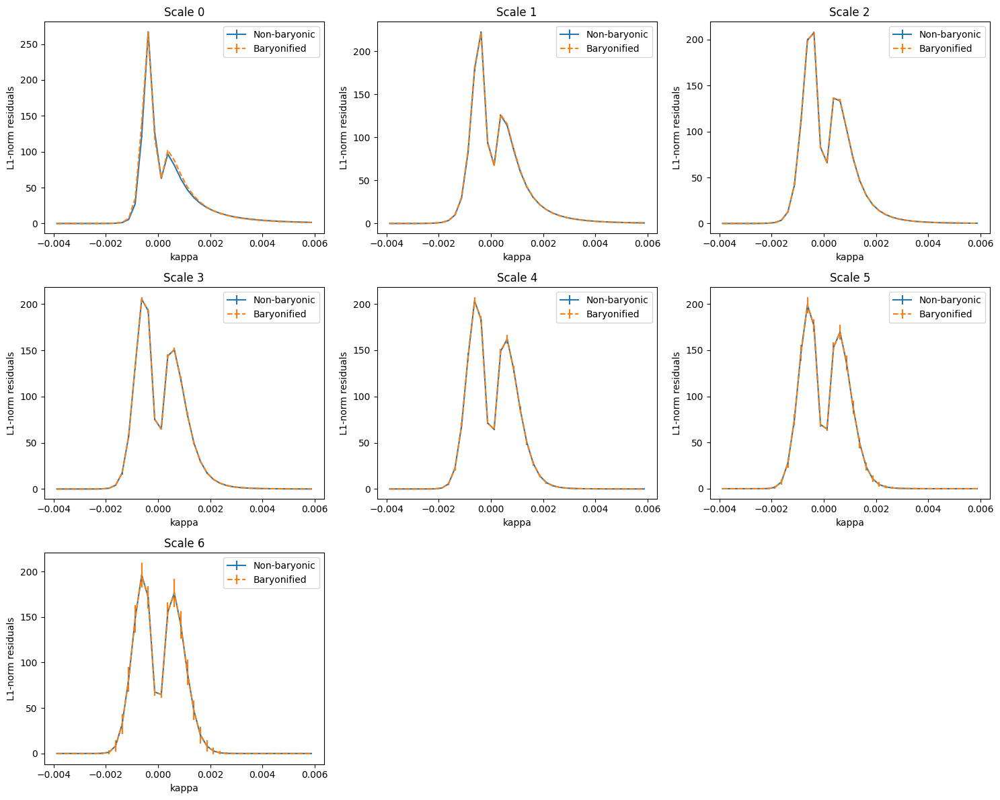

In [56]:
# Create a figure with subplots arranged in a grid (e.g., 3 rows, 3 columns)
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()  # Flatten the 2D grid of axes into a 1D array for easy iteration

for i in range(7):
    ax = axes[i]  # Get the current axis

    # Plot non-baryonic map (solid line with error bars)
    ax.errorbar(bins_coll_b[i], mean_l1_list_kg[i], yerr=var_l1_list_kg[i], label='Non-baryonic', linestyle='-')

    # Plot baryonified map (dashed line with error bars)
    ax.errorbar(bins_coll_b[i], mean_l1_list_kg_b[i], yerr=var_l1_list_kg_b[i], label='Baryonified', linestyle='--')

    # Set titles, labels, and legends
    ax.set_title(f'Scale {i}')
    ax.set_xlabel('kappa')
    ax.set_ylabel('L1-norm residuals')
    ax.legend()

# Remove any empty subplots
for i in range(7, 9):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

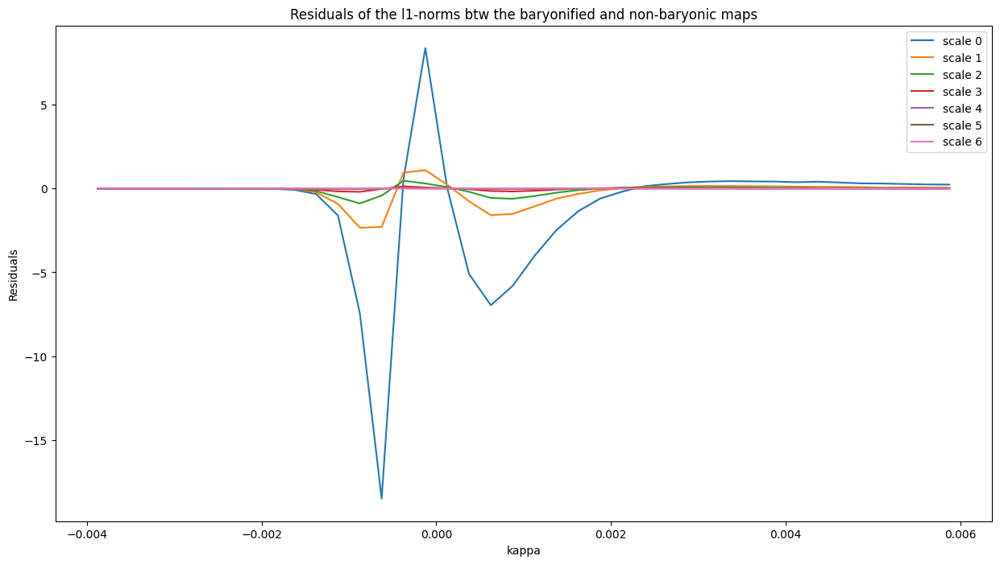

In [38]:
plt.figure(figsize=(15,8))
# plot the residuals of the l1-norms 
for i in range(7):
    plt.plot(bins_coll_b[i], mean_l1_list_kg[i] - mean_l1_list_kg_b[i], label=f'scale {i}')
    # plt.show()
plt.title('Residuals of the l1-norms btw the baryonified and non-baryonic maps')
plt.xlabel('kappa')
plt.ylabel('Residuals')
plt.legend()

Fractional differences

In [50]:
# Calculate fractional difference for each permutation
frac_diff_list = []
epsilon = 10e-5

for i in range(n_permutations):
    l1norm_b = l1_list_kg_array_b[i]  # Shape (8, 40)
    l1norm_nobar = l1_list_kg_array[i]  # Shape (8, 40)
    print('l1norm_b shape:', l1norm_b.shape) 

    # Calculate fractional difference for this realization
    frac_diff = np.abs(l1norm_b - l1norm_nobar) / (np.abs(l1norm_b) + epsilon)  # Shape (8, 40)
    frac_diff_list.append(frac_diff)
    print('frac_diff shape:', frac_diff.shape) 

# Convert to array for easier manipulation
frac_diff_array = np.array(frac_diff_list)  # Shape (200, 8, 40)
print('frac_diff_array shape:', frac_diff_array.shape) 

# Calculate mean and standard deviation across realizations (axis=0 for averaging over realizations)
frac_diff_mean = np.mean(frac_diff_array, axis=0)  # Shape (8, 40)
frac_diff_std = np.std(frac_diff_array, axis=0)  # Shape (8, 40)
print('frac_diff_mean shape:', frac_diff_mean.shape) 
print('frac_diff_std shape:', frac_diff_std.shape) 

l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 40)
frac_diff shape: (8, 40)
l1norm_b shape: (8, 

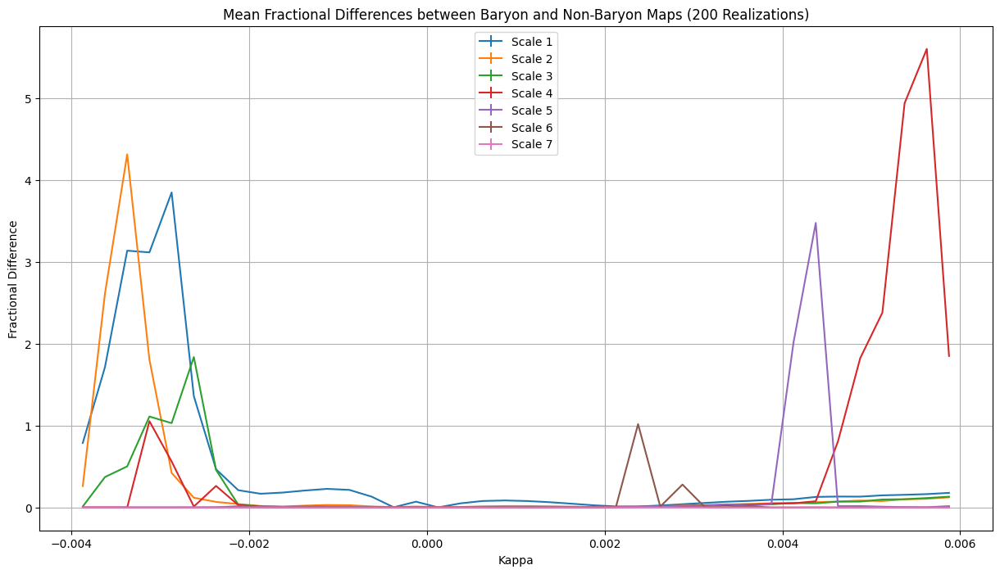

In [51]:
# Plot the fractional difference across bins for each scale
plt.figure(figsize=(15, 8))

# Loop over scales (8 scales in total)
for i in range(7):
    plt.errorbar(bins_coll_b[i,:], frac_diff_mean[i,:], yerr=frac_diff_std[i, :]*0, label=f'Scale {i + 1}')

plt.title('Mean Fractional Differences between Baryon and Non-Baryon Maps (200 Realizations)')
plt.xlabel('Kappa')
plt.ylabel('Fractional Difference')
plt.legend()
plt.grid(True)
plt.show()

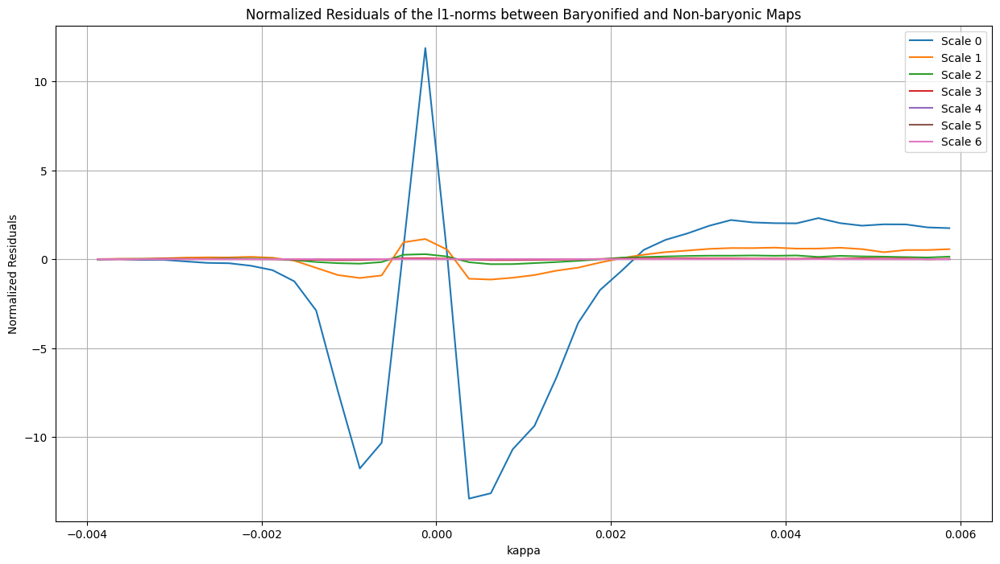

In [57]:
# Calculate the combined variance (assuming independent errors)
combined_variance = np.sqrt(var_l1_list_kg**2 + var_l1_list_kg_b**2)

# Create a figure
plt.figure(figsize=(15, 8))

# Plot normalized residuals of the l1-norms
for i in range(7):
    # Calculate the normalized residuals
    residuals = (mean_l1_list_kg[i] - mean_l1_list_kg_b[i]) / (combined_variance[i] + 1e-10)  # Add a small epsilon to avoid division by zero
    
    # Plot the normalized residuals
    plt.plot(bins_coll_b[i], residuals, label=f'Scale {i}')

# Set plot title, labels, and legend
plt.title('Normalized Residuals of the l1-norms between Baryonified and Non-baryonic Maps')
plt.xlabel('kappa')
plt.ylabel('Normalized Residuals')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

# BNT

In [12]:
import numpy as np

# Load data from a txt file into a NumPy array
nz1 = np.loadtxt('/home/tersenov/CosmoGridV1/stage3_forecast/nz/nz_stage3_1.txt')
nz2 = np.loadtxt('/home/tersenov/CosmoGridV1/stage3_forecast/nz/nz_stage3_2.txt')
nz3 = np.loadtxt('/home/tersenov/CosmoGridV1/stage3_forecast/nz/nz_stage3_3.txt')
nz4 = np.loadtxt('/home/tersenov/CosmoGridV1/stage3_forecast/nz/nz_stage3_4.txt')

In [51]:
nz_unorm = np.zeros((1000, 2))
nz_unorm[:,0] = nz1[:,0]
nz_unorm[:,1] = nz1[:,1] + nz2[:,1] + nz3[:,1] + nz4[:,1]

(0.0, 2.0)

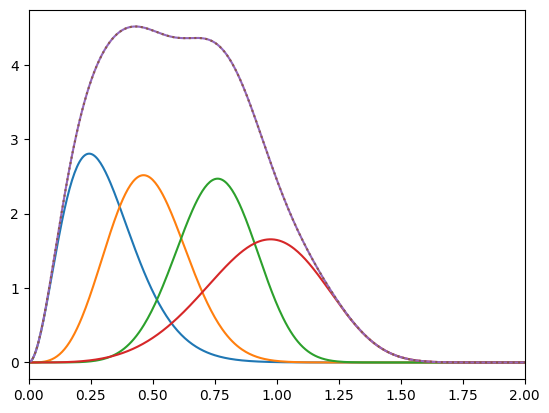

In [52]:
# plot n(z)
plt.plot(nz1[:,0], nz1[:,1])
plt.plot(nz2[:,0], nz2[:,1])
plt.plot(nz3[:,0], nz3[:,1])
plt.plot(nz4[:,0], nz4[:,1])
plt.plot(nz1[:,0], nz1[:,1]+nz2[:,1]+nz3[:,1]+nz4[:,1])
plt.plot(nz_unorm[:,0], nz_unorm[:,1], linestyle=':')
plt.xlim(0,2)

In [53]:
import jax
import jax_cosmo as jc
import jax.numpy as jnp

print("JAX version:", jax.__version__)
print("jax-cosmo version:", jc.__version__)

JAX version: 0.4.31
jax-cosmo version: 0.1.0


In [54]:
nz1_kde = jc.redshift.kde_nz(nz1[:,0], nz1[:,1], bw=0.005)
nz2_kde = jc.redshift.kde_nz(nz2[:,0], nz2[:,1], bw=0.005)
nz3_kde = jc.redshift.kde_nz(nz3[:,0], nz3[:,1], bw=0.005)
nz4_kde = jc.redshift.kde_nz(nz4[:,0], nz4[:,1], bw=0.005)
nz_unorm_kde = jc.redshift.kde_nz(nz_unorm[:,0], nz_unorm[:,1], bw=0.005)

In [55]:
nz1.shape, nz_unorm.shape

((1000, 2), (1000, 2))

(0.0, 2.0)

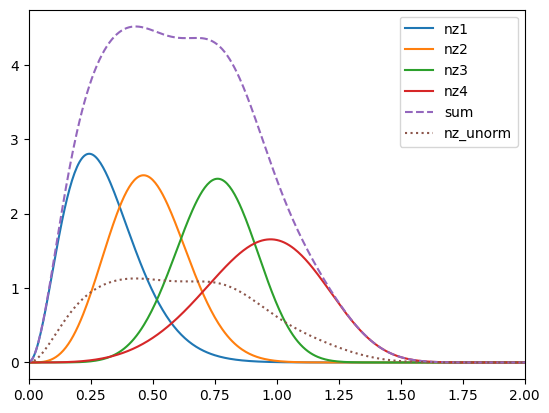

In [56]:
z = np.linspace(0,5,1000)
plt.plot(z, nz1_kde(z), label='nz1')
plt.plot(z, nz2_kde(z), label='nz2')
plt.plot(z, nz3_kde(z), label='nz3')
plt.plot(z, nz4_kde(z), label='nz4')
plt.plot(z, nz1_kde(z)+nz2_kde(z)+nz3_kde(z)+nz4_kde(z), linestyle='--', label='sum')
plt.plot(z, nz_unorm_kde(z), linestyle=':', label='nz_unorm')
plt.legend()
plt.xlim(0,2)

In [57]:
zmin = 0
zmax = 5.

In [61]:
# @title [Run me]

from scipy.integrate import simpson, romberg
from scipy.optimize import brentq
from scipy.special import erf

zsamp = np.linspace(zmin, zmax,4096)
norm = simpson(nz_unorm_kde(zsamp))
nz = lambda z: nz_unorm_kde(z)/norm

def subdivide( nbins, bintype='eq_dens'):
    """ Divide this redshift bins into sub-bins
        nbins : Number of bins to generate
        bintype : 'eq_dens' or 'eq_size'
    """
    # Compute the redshift boundaries for each bin generated
    zbounds = [zmin]
    bins = []
    n_per_bin = 1. / nbins
    for i in range(nbins-1):
        if bintype == 'eq_dens':
                zbound = brentq(lambda z: romberg(nz,zmin,z) - (i+1.0)*n_per_bin, zbounds[i], zmax)
        else:
            if bintype != 'eq_size':
                print ('WARNING : unknown binning scheme ' + bintype + '. Assuming equal size bins')
            zbound = (i+1.) * (zmax - zmin)/nbins

        zbounds.append(zbound)
    zbounds.append(zmax)
    return zbounds

photoz_bins = subdivide(4)

# Photoz distributions for first and last bins
def photz_unorm(z, zmin, zmax, zphot_sig=0.05):
    """ Computes the un-normalized n(z) """
    p = nz(z)

    # Apply photo-z errors
    x = 1.0/(sqrt(2.0)*zphot_sig*(1.0+z))
    res = 0.5* p *( erf((zmax - z )*x) - erf((zmin - z)*x))
    return res

# Building jax cosmo nz distributions
nzs_s = [jc.redshift.kde_nz(zsamp,
                            photz_unorm(zsamp, zmin=photoz_bins[i], zmax=photoz_bins[i+1]),
                            bw=(zmax - zmin)/4096,
                            gals_per_arcmin2=1./nbins)
           for i in range(0,nbins)]

/tmp/ipykernel_246126/3722909469.py:22: DeprecationWarning: `scipy.integrate.romberg` is deprecated as of SciPy 1.12.0and will be removed in SciPy 1.15.0. Please use`scipy.integrate.quad` instead.
  zbound = brentq(lambda z: romberg(nz,zmin,z) - (i+1.0)*n_per_bin, zbounds[i], zmax)


ValueError: setting an array element with a sequence.

In [63]:
import jax_cosmo.background as bkgrd
from jax_cosmo.scipy.integrate import simps

# Build cosmology object
cosmo = jc.Planck15()

# Defining the function that computes the lensing efficiency kernel

In [64]:
from functools import partial

@jax.jit
@partial(jax.vmap, in_axes=(None, None, 0))
def lensing_efficiency(cosmo, dndz, z):
  chi = bkgrd.radial_comoving_distance(cosmo, jc.utils.z2a(z))

  def integrand(z_prime):
    chi_prime = bkgrd.radial_comoving_distance(cosmo, jc.utils.z2a(z_prime))
    return (dndz(z_prime) * np.clip(chi_prime - chi, 0) / np.clip(chi_prime, 1.0))

  return simps(integrand, z, zmax, 256) * (1.0 + z) * chi

In [66]:
%pylab inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


/mnt/home/tersenov/software/cosmostat/cosmostat/lib/python3.10/site-packages/IPython/core/magics/pylab.py:166: UserWarning: pylab import has clobbered these variables: ['random', 'f', 'info', 'datetime', 'pylab', 'norm']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [67]:
for i in range(5):
  plot(z, nz[i](z), color='C%d'%i)
  plot(z, lensing_efficiency(cosmo, nz[i], z)/100, color='C%d'%i, ls='--')

xlim(0,1)
xlabel('redshift')
ylabel('n(z) or lensing efficiency')

NameError: name 'nzs_s' is not defined